# PART A

# • DOMAIN: Automobile


# • CONTEXT: The data concerns city-cycle fuel consumption in miles per gallon to be predicted in terms of 3 multivalued discrete and 5 continuous attributes.

# • PROJECT OBJECTIVE: To understand K-means Clustering by applying on the Car Dataset to segment the cars into various categories.

# 1. Data Understanding & Exploration:

# A. Read ‘Car name.csv’ as a DataFrame and assign it to a variable.

    * Import all the necessary libraries.

In [8]:
# Import necessary libraries

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import sklearn.metrics as metrics
from scipy import stats
from scipy.stats import zscore
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report
from sklearn import model_selection
from sklearn.tree import export_graphviz
from IPython.display import Image
from sklearn.tree import plot_tree
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings("ignore")

In [9]:
# READ THE CARNAME.CSV FILE DATA INTO CAR_NAME DATAFRAME

CAR_NAME = pd.read_csv("Car name.csv")

In [10]:
# PRINT THE FIRST 5 RECORDS OF THE DATA FRAME

print(CAR_NAME.head())

                    car_name
0  chevrolet chevelle malibu
1          buick skylark 320
2         plymouth satellite
3              amc rebel sst
4                ford torino


In [11]:
# PRINT THE LAST 5 RECORDS OF THE DATA FRAME

print(CAR_NAME.tail())

            car_name
393  ford mustang gl
394        vw pickup
395    dodge rampage
396      ford ranger
397       chevy s-10


    THERE ARE TOTAL OF 398 RECORDS IN THE CSV FILE WHICH ARE CAR NAMES AND THE DATA IS LOADED INTO CAR_NAME DATASET

# B. Read ‘Car-Attributes.json as a DataFrame and assign it to a variable.

In [12]:
# READ THE CAR-ATTRIBUTES.JSON FILE DATA INTO DATAFRAME NAMED CAR_DATA

CAR_DATA = pd.read_json("Car-Attributes.json")

In [13]:
# PRINT THE FIRST FIVE RECORDS OF THE CAR_DATA

print(CAR_DATA.head())

    mpg  cyl   disp   hp    wt   acc  yr  origin
0  18.0    8  307.0  130  3504  12.0  70       1
1  15.0    8  350.0  165  3693  11.5  70       1
2  18.0    8  318.0  150  3436  11.0  70       1
3  16.0    8  304.0  150  3433  12.0  70       1
4  17.0    8  302.0  140  3449  10.5  70       1


In [14]:
# PRINT THE LAST FIVE RECORDS OF THE CAR_DATA

print(CAR_DATA.tail())

      mpg  cyl   disp  hp    wt   acc  yr  origin
393  27.0    4  140.0  86  2790  15.6  82       1
394  44.0    4   97.0  52  2130  24.6  82       2
395  32.0    4  135.0  84  2295  11.6  82       1
396  28.0    4  120.0  79  2625  18.6  82       1
397  31.0    4  119.0  82  2720  19.4  82       1


    THERE ARE TOTAL OF 398 RECORDS IN THE DATA FRAME CAR_DATA

# C. Merge both the DataFrames together to form a single DataFrame

In [15]:
# MERGE THE DATA FRAMES CAR_NAME AND CAR_DATA INTO FINAL DATA FRAME CARS

# SINCE THERE ARE NO COMMON COLUMNS IN THE BOTH DATA FRAMES, WE CANNOT MERGE OR JOIN THE BOTH DATA FRAMES AS THERE IS NO
# POSSIBILITY TO SPECIFY A CONDITION ON DATA SETS. SO WE ARE PROCEEDING WITH THE APPENDING OF DATA FRAMES AS BOTH THE 
# DATA SETS CONTAINS EQUAL ROWS AND WE CAN ASSIGN THE CAR NAMES IN CAR_NAME TO THE PERTAINING ROW DATA IN THE CAR_DATA

CARS = CAR_NAME.join(CAR_DATA)

In [16]:
#PRINT THE FIRST FIVE RECORDS OF THE NEW DATA FRAME CARS

print(CARS.head())

                    car_name   mpg  cyl   disp   hp    wt   acc  yr  origin
0  chevrolet chevelle malibu  18.0    8  307.0  130  3504  12.0  70       1
1          buick skylark 320  15.0    8  350.0  165  3693  11.5  70       1
2         plymouth satellite  18.0    8  318.0  150  3436  11.0  70       1
3              amc rebel sst  16.0    8  304.0  150  3433  12.0  70       1
4                ford torino  17.0    8  302.0  140  3449  10.5  70       1


In [17]:
#PRINT THE LAST FIVE RECORDS OF THE NEW DATA FRAME CARS

print(CARS.tail())

            car_name   mpg  cyl   disp  hp    wt   acc  yr  origin
393  ford mustang gl  27.0    4  140.0  86  2790  15.6  82       1
394        vw pickup  44.0    4   97.0  52  2130  24.6  82       2
395    dodge rampage  32.0    4  135.0  84  2295  11.6  82       1
396      ford ranger  28.0    4  120.0  79  2625  18.6  82       1
397       chevy s-10  31.0    4  119.0  82  2720  19.4  82       1


    THE MERGED DATA FRAME CARS CONTAINS 398 ROWS OF CAR MODEL NAMES AND RELATED DATA.

In [18]:
# PRINT THE DATA TYPES OF ALL THE COLUMNS IN THE CARS DATA FRAME

print(CARS.dtypes)

car_name     object
mpg         float64
cyl           int64
disp        float64
hp           object
wt            int64
acc         float64
yr            int64
origin        int64
dtype: object


In [19]:
# PRINT INFORMATION OF CARS DATA 

print(CARS.info())

print('\n\nTOTAL NO OF ROWS AND COLUMNS IN THE CARS DATA FRAME:',CARS.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   car_name  398 non-null    object 
 1   mpg       398 non-null    float64
 2   cyl       398 non-null    int64  
 3   disp      398 non-null    float64
 4   hp        398 non-null    object 
 5   wt        398 non-null    int64  
 6   acc       398 non-null    float64
 7   yr        398 non-null    int64  
 8   origin    398 non-null    int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 28.1+ KB
None


TOTAL NO OF ROWS AND COLUMNS IN THE CARS DATA FRAME: (398, 9)


    FROM THE ABOVE INFORMATION,
        * THERE ARE 398 FIELDS IN ALL THE COLUMNS.
        * THERE ARE NO NULL FIELDS IN THE DATA.
        * HORSE POWER COLUMN CONTAINS INTEGER DATA BUT REPRESENTED AS OBJECT DATA TYPE.

In [20]:
# PRINT ALL THE UNIQUE VALUES IN THE HORSE POWER COLUMN AND SEE WHETHER THERE ARE ANY STRINGS OR SPECIAL CHARACTERS

print(CARS.hp.unique())

print('\n\nROWS IN CARS DATA FRAME HAS ? IN HORSE POWER COLUMN:\n',CARS[CARS['hp'] == '?'])

[130 165 150 140 198 220 215 225 190 170 160 95 97 85 88 46 87 90 113 200
 210 193 '?' 100 105 175 153 180 110 72 86 70 76 65 69 60 80 54 208 155
 112 92 145 137 158 167 94 107 230 49 75 91 122 67 83 78 52 61 93 148 129
 96 71 98 115 53 81 79 120 152 102 108 68 58 149 89 63 48 66 139 103 125
 133 138 135 142 77 62 132 84 64 74 116 82]


ROWS IN CARS DATA FRAME HAS ? IN HORSE POWER COLUMN:
                  car_name   mpg  cyl   disp hp    wt   acc  yr  origin
32             ford pinto  25.0    4   98.0  ?  2046  19.0  71       1
126         ford maverick  21.0    6  200.0  ?  2875  17.0  74       1
330  renault lecar deluxe  40.9    4   85.0  ?  1835  17.3  80       2
336    ford mustang cobra  23.6    4  140.0  ?  2905  14.3  80       1
354           renault 18i  34.5    4  100.0  ?  2320  15.8  81       2
374        amc concord dl  23.0    4  151.0  ?  3035  20.5  82       1


    * THERE ARE 6 ROWS THAT CONTAINS THE ? IN THE HORSEPOWER COLUMN
    
    * LET US DROP ALL THOSE ROWS THAT CONTAINS ? IN FURTHER ANALYSIS

# D. Print 5 point summary of the numerical features and share insights.

In [21]:
# PRINT DESCRIBE() ON CARS DATA FRAME

print('\n\n',CARS.describe())



               mpg         cyl        disp           wt         acc  \
count  398.000000  398.000000  398.000000   398.000000  398.000000   
mean    23.514573    5.454774  193.425879  2970.424623   15.568090   
std      7.815984    1.701004  104.269838   846.841774    2.757689   
min      9.000000    3.000000   68.000000  1613.000000    8.000000   
25%     17.500000    4.000000  104.250000  2223.750000   13.825000   
50%     23.000000    4.000000  148.500000  2803.500000   15.500000   
75%     29.000000    8.000000  262.000000  3608.000000   17.175000   
max     46.600000    8.000000  455.000000  5140.000000   24.800000   

               yr      origin  
count  398.000000  398.000000  
mean    76.010050    1.572864  
std      3.697627    0.802055  
min     70.000000    1.000000  
25%     73.000000    1.000000  
50%     76.000000    1.000000  
75%     79.000000    2.000000  
max     82.000000    3.000000  


    * THERE ARE NO NEGATIVE VALUES IN THE COLUMNS
    * DISP AND WT COLUMNS ARE MORE RIGHT SKEWED
    * PRESENSE OF OUT LIERS IN THE DISP AND WT COLUMNS

# 2. Data Preparation & Analysis:

# A. Check and print feature-wise percentage of missing values present in the data and impute with the best suitable approach.

In [22]:
# CHECK FOR MISSING VALUES IN THE EACH COLUMN IN THE CARS DATA FRAME

print(CARS.isna().sum())

car_name    0
mpg         0
cyl         0
disp        0
hp          0
wt          0
acc         0
yr          0
origin      0
dtype: int64


    * THERE ARE NO NULL / MISSING VALUES IN THE CARS DATA FRAME

# B. Check for duplicate values in the data and impute with the best suitable approach.

In [23]:
# PRINT THE COUNT OF DUPLICATE VALUES IN THE CARS DATA FRAME. IF PRESENT, WE WILL TRY TO IMPUTE THOSE DATA

print('TOTAL NUMBER OF DUPLICATE VALUES PRESENT IN CARS DATA FRAME:',CARS.duplicated().sum())

TOTAL NUMBER OF DUPLICATE VALUES PRESENT IN CARS DATA FRAME: 0


    * THERE ARE NO DUPLICATE VALUES PRESENT IN THE CARS DATA FRAME

# C. Plot a pairplot for all features.

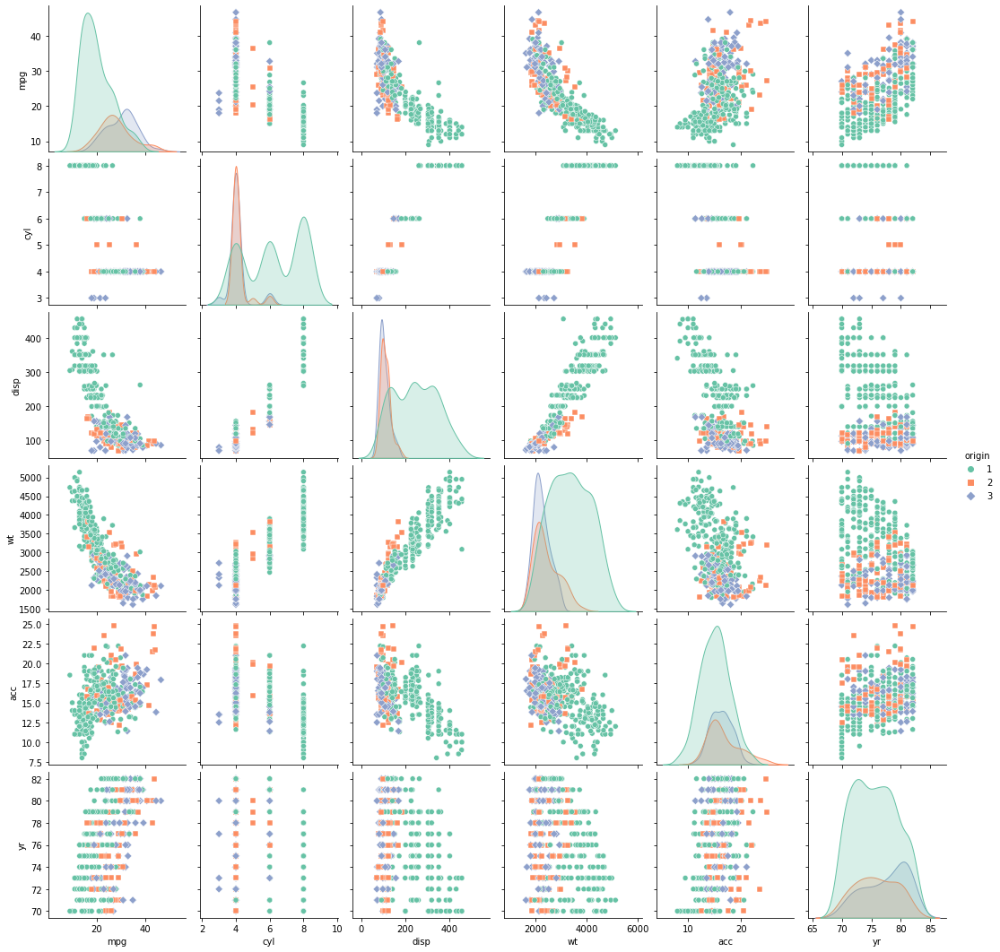

In [24]:
sns.pairplot(CARS, hue = "origin", diag_kind = "kde",kind = "scatter", markers=["o", "s", "D"],palette = "Set2")

plt.show()

    *WE USED HUE ON ORIGIN AND PLOTTED PAIR PLOT FOR ALL THE COLUMNS IN THE CARS DATA

# D. Visualize a scatterplot for ‘wt’ and ‘disp’. Datapoints should be distinguishable by ‘cyl’.

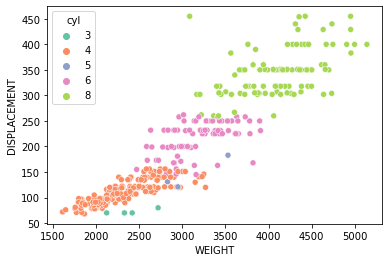

In [25]:
ax = sns.scatterplot(data=CARS, x="wt", y="disp", hue="cyl", palette="Set2")

ax.set_xlabel("WEIGHT")

ax.set_ylabel("DISPLACEMENT")

plt.show()

# E. Share insights for Q2.d.

    *WE HAVE DRAWN SCATTER PLOT AGAINST WEIGHT AND DISPLACEMENT FROM THE CARS DATA.
    
    *WE USED CYCLINDER COLUMN DATA TO DISTINGUISH THE DATA POINTS.
    
    *CYLINDER VALUE 8,4,6 HAVE MORE DATA POINTS AND 3,5 HAS LESS DATA POINTS

# F. Visualize a scatterplot for ‘wt’ and ’mpg’. Datapoints should be distinguishable by ‘cyl’.

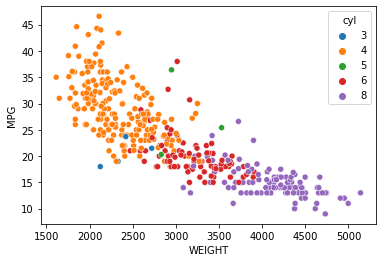

In [26]:
ax = sns.scatterplot(data=CARS, x="wt", y="mpg", hue="cyl", palette="tab10")

ax.set_xlabel("WEIGHT")

ax.set_ylabel("MPG")

plt.show()

# G. Share insights for Q2.f.

    * WE HAVE DRAWN A SCATTER PLOT FOR WEIGHT AGAINST MPG WITH CYLINDER AS HUE
    
    * CYLINDER WITH 4,6,8 HAVE MAXIMUM DATA POINTS AGAINST CYLINDER VALUE 3,5

# H. Check for unexpected values in all the features and datapoints with such values.

In [27]:
for i in CARS.columns:
    print('UNIQUE VALUES IN COLUMN ',i)
    print(CARS[i].unique())
    print('\n')

UNIQUE VALUES IN COLUMN  car_name
['chevrolet chevelle malibu' 'buick skylark 320' 'plymouth satellite'
 'amc rebel sst' 'ford torino' 'ford galaxie 500' 'chevrolet impala'
 'plymouth fury iii' 'pontiac catalina' 'amc ambassador dpl'
 'dodge challenger se' "plymouth 'cuda 340" 'chevrolet monte carlo'
 'buick estate wagon (sw)' 'toyota corona mark ii' 'plymouth duster'
 'amc hornet' 'ford maverick' 'datsun pl510'
 'volkswagen 1131 deluxe sedan' 'peugeot 504' 'audi 100 ls' 'saab 99e'
 'bmw 2002' 'amc gremlin' 'ford f250' 'chevy c20' 'dodge d200' 'hi 1200d'
 'chevrolet vega 2300' 'toyota corona' 'ford pinto'
 'plymouth satellite custom' 'ford torino 500' 'amc matador'
 'pontiac catalina brougham' 'dodge monaco (sw)'
 'ford country squire (sw)' 'pontiac safari (sw)'
 'amc hornet sportabout (sw)' 'chevrolet vega (sw)' 'pontiac firebird'
 'ford mustang' 'mercury capri 2000' 'opel 1900' 'peugeot 304' 'fiat 124b'
 'toyota corolla 1200' 'datsun 1200' 'volkswagen model 111'
 'plymouth cricket' '

    * WE HAVE PRINTED UNIQUE VALUES IN ALL THE COLUMNS OF THE CAR DATA.
    
    * COLUMN HP HAS "?" IN SOME OF THE ROWS.

In [28]:
print('ROWS THAT CONTAIN ? IN THE HORSE POWER COLUMN:\n',CARS[CARS['hp'] == '?'])

ROWS THAT CONTAIN ? IN THE HORSE POWER COLUMN:
                  car_name   mpg  cyl   disp hp    wt   acc  yr  origin
32             ford pinto  25.0    4   98.0  ?  2046  19.0  71       1
126         ford maverick  21.0    6  200.0  ?  2875  17.0  74       1
330  renault lecar deluxe  40.9    4   85.0  ?  1835  17.3  80       2
336    ford mustang cobra  23.6    4  140.0  ?  2905  14.3  80       1
354           renault 18i  34.5    4  100.0  ?  2320  15.8  81       2
374        amc concord dl  23.0    4  151.0  ?  3035  20.5  82       1


    *THERE ARE 6 ROWS IN THE CARS DATA FRAME THAT CONTAINS VALUES "?"
    
    *WE WILL DROP ALL THOSE 6 ROWS THAT CONTAINS THE SPECIAL CHARACTER "?"

In [29]:
#WE CAN EITHER PROCEED TO DROP THE ROWS THAT HAS "?" SYMBOL OR REPLACE THE "?" WITH MEDIAN VALUE
#CARS = CARS[CARS.hp != '?']
#print('SHAPE OF THE DATA FRAME CARS AFTER DROPPING THE 6 ROWS THAT CONTAINS SPECIAL CHARACTER:',CARS.shape)

CARS['hp'].replace("?",np.nan, inplace=True)
CARS['hp'].fillna((CARS['hp'].median()), inplace=True)

In [30]:
# CHANGE THE COLUMN NAMES FOR MORE READABILITY.

CARS.rename(columns = {'car_name':'NAME','mpg':'MPG','cyl':'CYLINDER','disp':'DISPLACEMENT',
                       'hp':'HORSE POWER','wt':'WEIGHT','acc':'ACCELERATION','yr':'MODEL YEAR',
                       'origin':'ORIGIN'},inplace = True)

In [31]:
CARS['HORSE POWER'] = CARS['HORSE POWER'].astype('float')

In [32]:
print(CARS.describe())

              MPG    CYLINDER  DISPLACEMENT  HORSE POWER       WEIGHT  \
count  398.000000  398.000000    398.000000   398.000000   398.000000   
mean    23.514573    5.454774    193.425879   104.304020  2970.424623   
std      7.815984    1.701004    104.269838    38.222625   846.841774   
min      9.000000    3.000000     68.000000    46.000000  1613.000000   
25%     17.500000    4.000000    104.250000    76.000000  2223.750000   
50%     23.000000    4.000000    148.500000    93.500000  2803.500000   
75%     29.000000    8.000000    262.000000   125.000000  3608.000000   
max     46.600000    8.000000    455.000000   230.000000  5140.000000   

       ACCELERATION  MODEL YEAR      ORIGIN  
count    398.000000  398.000000  398.000000  
mean      15.568090   76.010050    1.572864  
std        2.757689    3.697627    0.802055  
min        8.000000   70.000000    1.000000  
25%       13.825000   73.000000    1.000000  
50%       15.500000   76.000000    1.000000  
75%       17.175000 

In [33]:
print('CORRELATION MATRIX:')
CARS.corr(method = 'pearson')

CORRELATION MATRIX:


,MPG,CYLINDER,DISPLACEMENT,HORSE POWER,WEIGHT,ACCELERATION,MODEL YEAR,ORIGIN
MPG,1.000000,-0.775396,-0.804203,-0.773453,-0.831741,0.420289,0.579267,0.563450
CYLINDER,-0.775396,1.000000,0.950721,0.841284,0.896017,-0.505419,-0.348746,-0.562543
DISPLACEMENT,-0.804203,0.950721,1.000000,0.895778,0.932824,-0.543684,-0.370164,-0.609409
HORSE POWER,-0.773453,0.841284,0.895778,1.000000,0.862442,-0.686590,-0.413733,-0.452096
WEIGHT,-0.831741,0.896017,0.932824,0.862442,1.000000,-0.417457,-0.306564,-0.581024
ACCELERATION,0.420289,-0.505419,-0.543684,-0.686590,-0.417457,1.000000,0.288137,0.205873
MODEL YEAR,0.579267,-0.348746,-0.370164,-0.413733,-0.306564,0.288137,1.000000,0.180662
ORIGIN,0.563450,-0.562543,-0.609409,-0.452096,-0.581024,0.205873,0.180662,1.000000


    *BELOW PAIRS ARE HIGHLY CORRELATED:
        .CYLINDER AND DISPLACEMENT
        .WEIGHT AND DISPLACEMENT

    *BELOW PAIRS ARE LOOSELY CORRELATED:
        .MPG AND CYLINDER
        .DISPLACEMENT AND MPG
        .WEIGHT AND MPG
        .HORSEPOWER AND MPG

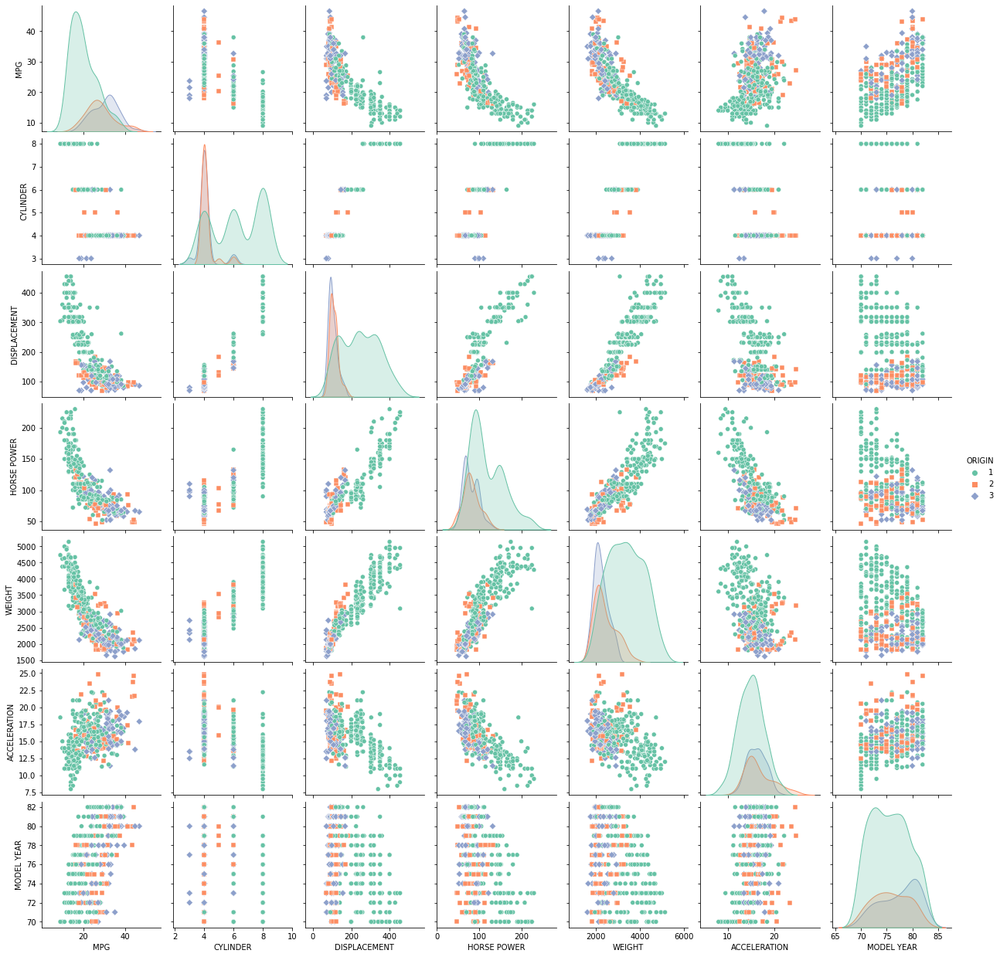

In [34]:
sns.pairplot(CARS, hue = "ORIGIN", diag_kind = "kde",kind = "scatter", markers=["o", "s", "D"],palette = "Set2")

plt.show()

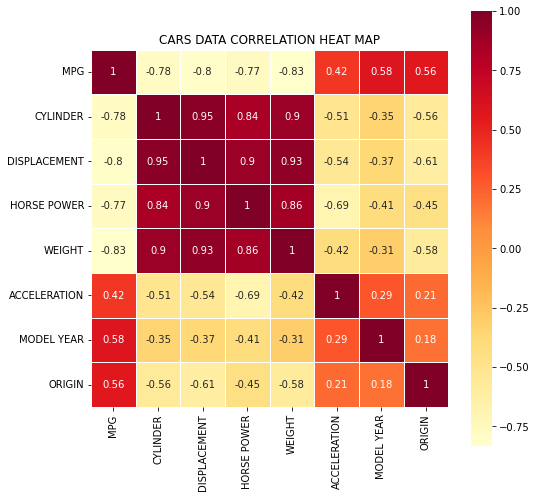

In [35]:
plt.figure(figsize=(8,8))

ax = sns.heatmap(CARS.corr(method = 'pearson'), annot = True, linewidths = 1, square = True, cmap="YlOrRd")

plt.title("CARS DATA CORRELATION HEAT MAP")

plt. show()

    * MODEL YEAR HAS MIN VALUE 70 AND MAX VALUE 82.
    * WE ASSUME THAT THE SEGMENTATION PROCESS IS BEING CARRIED OUT IN THE YEAR 83.
    * WITH THIS ASSUMPTION, WE CAN CALCULATE THE AGE OF THE VEHICLE BY FORMULA 83 - MODEL YEAR
    * ONCE THE AGE IS CALCULATED, WE CAN DROP THE YEAR COLUMN.
    * AGE IN THIS SCENARIO REPRESENTS FROM HOW MANY YEARS THE CAR IS BEING USED

In [36]:
CARS['AGE'] = 83 - CARS['MODEL YEAR']

    * ORIGIN HAS THREE VALUES 1,2,3. CARS BELONGING TO ORIGIN 1 ARE MORE THAN 2 AND 3 COMBINED.
    * WE CAN CREATE 3 VARIABLE FOR 1,2,3 AND NAME THEM AS ORIGIN_1, ORIGIN_2, ORIGIN_3
    * THIS HELPS THE MODEL IN UNDERSTANDING THE TRAINING DATA AND CAN BE RESCALED EASILY.

In [37]:
# ONE-HOT ENCODING THE COLUMN ORIGIN AND CREATE THRE VARIABLES ORIGIN_1,ORIGIN_2,ORIGIN_3
OHEC = pd.get_dummies(CARS['ORIGIN'])
OHEC = OHEC.add_prefix('ORIGIN_')

In [38]:
# JOIN THE THREE NEW VARIABLES ORIGIN_1,ORIGIN_2,ORIGIN_3 TO THE OUR DATA FRAME CARS

CARS = CARS.join(OHEC)
CARS_COPY = CARS.copy()
CARS.head()

,NAME,MPG,CYLINDER,DISPLACEMENT,HORSE POWER,WEIGHT,ACCELERATION,MODEL YEAR,ORIGIN,AGE,ORIGIN_1,ORIGIN_2,ORIGIN_3
0,chevrolet chevelle malibu,18.0,8,307.0,130.0,3504,12.0,70,1,13,1,0,0
1,buick skylark 320,15.0,8,350.0,165.0,3693,11.5,70,1,13,1,0,0
2,plymouth satellite,18.0,8,318.0,150.0,3436,11.0,70,1,13,1,0,0
3,amc rebel sst,16.0,8,304.0,150.0,3433,12.0,70,1,13,1,0,0
4,ford torino,17.0,8,302.0,140.0,3449,10.5,70,1,13,1,0,0


In [39]:
# DROP THE COLUMNS MODEL YEAR AND ORIGIN FROM THE DATA FRAME
# WE ARE DROPPING MODEL YEAR SINCE WE HAVE CALCULATED THE AGE OF THE CAR AND HAVING MODEL YEAR ALONG WITH AGE IS NOT MUCH USEFUL
# SINCE WE CREATED DUMMIES ON ORIGIN COLUMN, WE CAN DROP THE ORIGIN COLUMN
# SINCE WE HAVE ALL THE CAR NAMES UNIQUE, WE CAN DROP THE CAR NAMES AS IT WILL BE DIFFICULT TO CATEGORISE

CARS = CARS.drop(['MODEL YEAR','ORIGIN','NAME'],axis = 1)

CARS.head()

,MPG,CYLINDER,DISPLACEMENT,HORSE POWER,WEIGHT,ACCELERATION,AGE,ORIGIN_1,ORIGIN_2,ORIGIN_3
0,18.0,8,307.0,130.0,3504,12.0,13,1,0,0
1,15.0,8,350.0,165.0,3693,11.5,13,1,0,0
2,18.0,8,318.0,150.0,3436,11.0,13,1,0,0
3,16.0,8,304.0,150.0,3433,12.0,13,1,0,0
4,17.0,8,302.0,140.0,3449,10.5,13,1,0,0


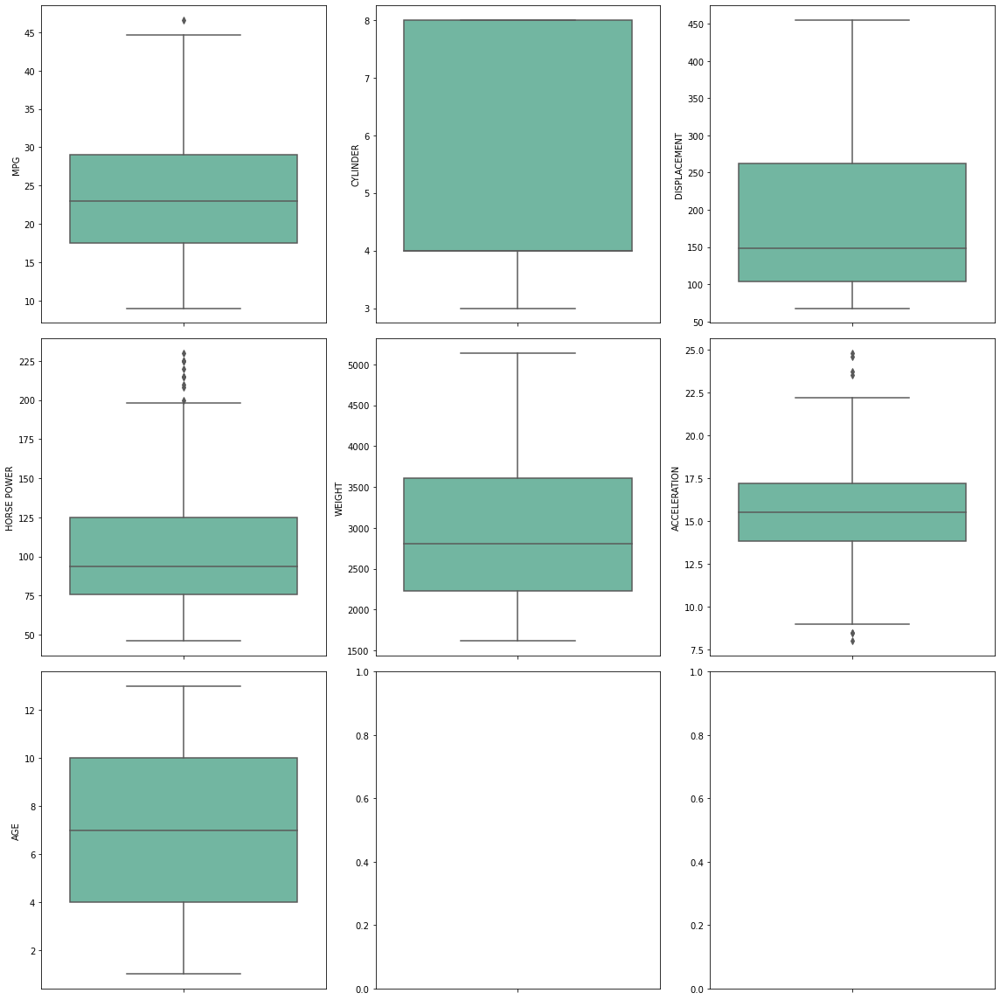

In [40]:
COLS = CARS.drop(['ORIGIN_1','ORIGIN_2','ORIGIN_3'],axis = 1).columns

fig, ax = plt.subplots(3, 3, sharex=True, figsize=(16,16))
x=0
y=0

for i in COLS:
    sns.boxplot(y = CARS[i], ax = ax[x, y], palette="Set2")
    y = y+1
    if y == 3:
        x=x+1
        y=0

fig.tight_layout()
plt.show()

    *THERE ARE PRESENCE OF OUTLIERS IN HORSE POWER, ACCELERATION AND MPG COLUMNS
    *DEALING WITH OUTLIERS CAN HELP US IN BETTER TRAINING THE MODEL.
    *WE CAN EITHER REMOVE THE OUTLIERS OR TRANSFORM THEM TO FIT THE DATA
    *SINCE THE AMOUNT OF OUTLIERS ARE VERY LOW, LET US FIT THEM INTO OUR DATA.
    *WE CAN EITHER USE LOG TRANSFORM OR WINSORIZE OR ANY ROBUST SCALER METHOD.
    *I WILL BE PROCEEDING WITH WINSORIZE TO DEAL WITH OUTLIERS.

In [41]:
from scipy.stats.mstats import winsorize
CARS['HORSE POWER'] = winsorize(CARS['HORSE POWER'],(0,0.03))
CARS['ACCELERATION'] = winsorize(CARS['ACCELERATION'],(0.02,0.02))
CARS['MPG'] = winsorize(CARS['MPG'],(0,0.01))

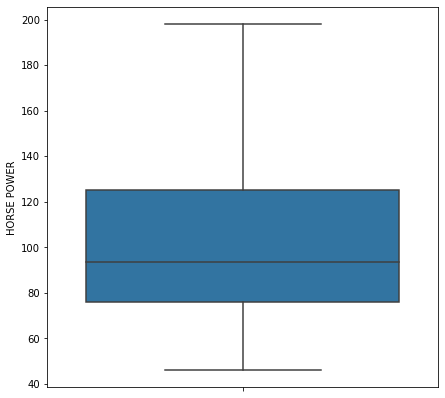

In [42]:
fig, ax = plt.subplots(figsize=(7,7))

sns.boxplot(y = CARS['HORSE POWER'])

plt.show()

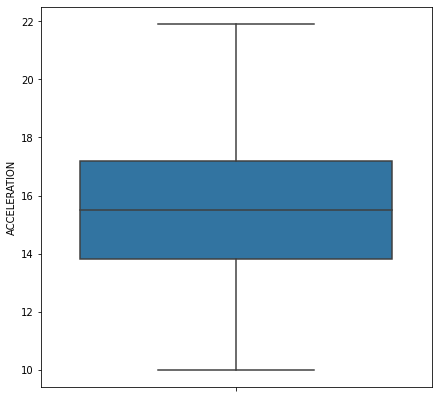

In [43]:
fig, ax = plt.subplots(figsize=(7,7))

sns.boxplot(y = CARS['ACCELERATION'])

plt.show()

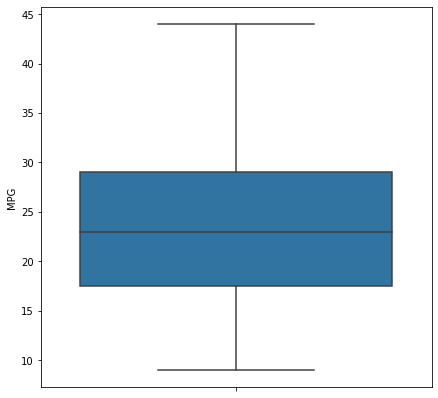

In [44]:
fig, ax = plt.subplots(figsize=(7,7))

sns.boxplot(y = CARS['MPG'])

plt.show()

    *ON APPLYING WINSORIZE TO DEAL WITH OUTLIERS
    *AFTER TRANSFORMING OUTLIERS, WE CAN SEE THAT THERE ARE NO OUTLIERS IN THE NEW BOX PLOTS ABOVE.

In [45]:
print('CORRELATION MATRIX:')
CARS.corr(method = 'pearson')

CORRELATION MATRIX:


,MPG,CYLINDER,DISPLACEMENT,HORSE POWER,WEIGHT,ACCELERATION,AGE,ORIGIN_1,ORIGIN_2,ORIGIN_3
MPG,1.000000,-0.776848,-0.805559,-0.787166,-0.833124,0.417775,-0.579854,-0.568504,0.260098,0.441526
CYLINDER,-0.776848,1.000000,0.950721,0.853810,0.896017,-0.508944,0.348746,0.604351,-0.352861,-0.396479
DISPLACEMENT,-0.805559,0.950721,1.000000,0.899950,0.932824,-0.545891,0.370164,0.651407,-0.373886,-0.433505
HORSE POWER,-0.787166,0.853810,0.899950,1.000000,0.874271,-0.690715,0.411683,0.493953,-0.287690,-0.324734
WEIGHT,-0.833124,0.896017,0.932824,0.874271,1.000000,-0.421968,0.306564,0.598398,-0.298843,-0.440817
ACCELERATION,0.417775,-0.508944,-0.545891,-0.690715,-0.421968,1.000000,-0.282737,-0.245515,0.191658,0.114956
AGE,-0.579854,0.348746,0.370164,0.411683,0.306564,-0.282737,1.000000,0.139883,0.024489,-0.193101
ORIGIN_1,-0.568504,0.604351,0.651407,0.493953,0.598398,-0.245515,0.139883,1.000000,-0.597198,-0.643317
ORIGIN_2,0.260098,-0.352861,-0.373886,-0.287690,-0.298843,0.191658,0.024489,-0.597198,1.000000,-0.229895
ORIGIN_3,0.441526,-0.396479,-0.433505,-0.324734,-0.440817,0.114956,-0.193101,-0.643317,-0.229895,1.000000


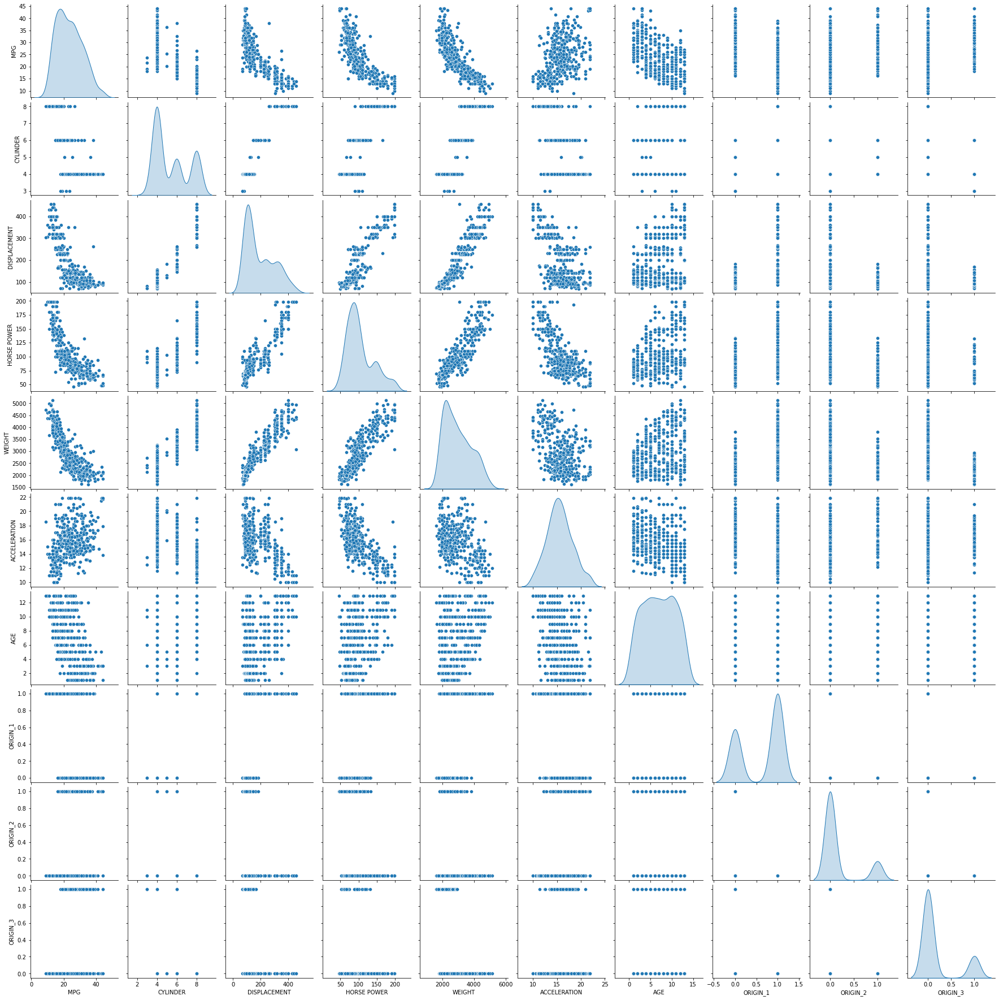

In [46]:
sns.pairplot(CARS, diag_kind = "kde",kind = "scatter", palette = "Set2")

plt.show()

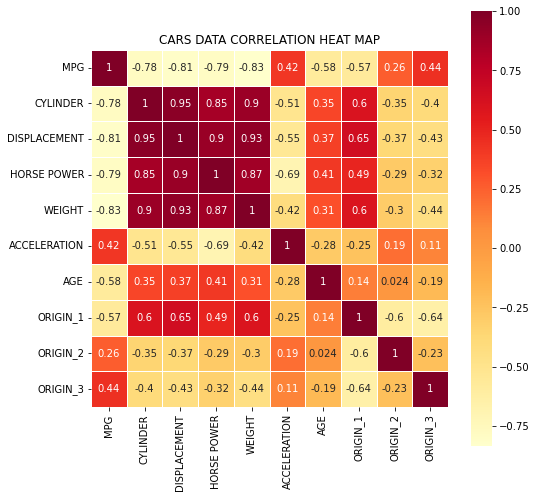

In [47]:
plt.figure(figsize=(8,8))

ax = sns.heatmap(CARS.corr(method = 'pearson'), annot = True, linewidths = 1, square = True, cmap="YlOrRd")

plt.title("CARS DATA CORRELATION HEAT MAP")

plt. show()

    * AFTER DROPPING THE COLUMNS THAT DOES NOT HAVE MUCH SIGNIFICANCE AND TRANSFORMING OUTLIERS,
        WE HAVE DRAWN CORRELATION MATRIX, PAIR PLOT AND HEAT MAP FOR THE NEW DATA SET FORMED.

    * SINCE WE HAVE DEALTH WITH OUTLIERS AND OTHER FEATURES, WE HAVE OBTAINED FINAL DATA FRAME.
    
    * NOW WE WILL PROCEED FOR SCALING THE DATA.

In [48]:
from sklearn.preprocessing import StandardScaler

CARS[COLS] = StandardScaler().fit_transform(CARS[COLS])

In [49]:
print(CARS.head())

        MPG  CYLINDER  DISPLACEMENT  HORSE POWER    WEIGHT  ACCELERATION  \
0 -0.707513  1.498191      1.090604     0.714760  0.630870     -1.346115   
1 -1.093024  1.498191      1.503514     1.668733  0.854333     -1.535120   
2 -0.707513  1.498191      1.196232     1.259888  0.550470     -1.724125   
3 -0.964520  1.498191      1.061796     1.259888  0.546923     -1.346115   
4 -0.836017  1.498191      1.042591     0.987324  0.565841     -1.913130   

        AGE  ORIGIN_1  ORIGIN_2  ORIGIN_3  
0  1.627426         1         0         0  
1  1.627426         1         0         0  
2  1.627426         1         0         0  
3  1.627426         1         0         0  
4  1.627426         1         0         0  


# 3. Clustering:

# A. Apply K-Means clustering for 2 to 10 clusters.

In [50]:
RANGE = np.arange(2,11,1)
ERRORS = []
for i in RANGE:
    CLUSTERS= KMeans(i, n_init = 10)
    CLUSTERS.fit(CARS)
    LABELS = CLUSTERS.labels_
    CENTROIDS = CLUSTERS.cluster_centers_
    ERRORS.append(CLUSTERS.inertia_)

CL_DF = pd.DataFrame({"RANGE": RANGE, "ERRORS": ERRORS})
CL_DF[0:11]

,RANGE,ERRORS
0,2,1462.643320
1,3,1095.599851
2,4,880.387217
3,5,794.288409
4,6,728.508003
5,7,667.138643
6,8,623.367316
7,9,579.310427
8,10,549.468352


# B. Plot a visual and find elbow point.

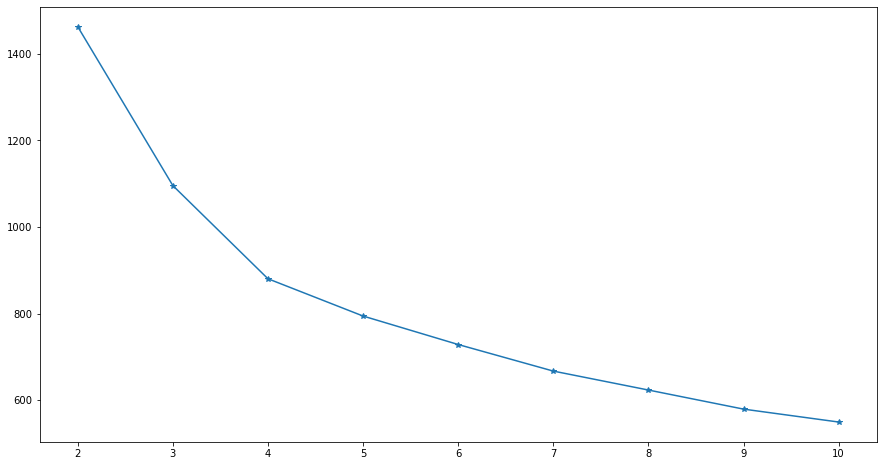

In [51]:
from matplotlib import cm

plt.figure(figsize=(15,8))
plt.plot( CL_DF.RANGE, CL_DF.ERRORS, marker = "*" )

plt.show()

    *FROM THE ABOVE PLOT, WE CAN CONSIDER OUR ELBOW POINT AT 4.

# C. On the above visual, highlight which are the possible Elbow points.

    * FROM THE ABOVE VISUAL, WE CAN SEE THAT THERE IS SHARP CURVE AT 4
    * AT 3 AND 7, WE CAN ALSO CONSIDER THEM AS ELBOW POINTS, BUT 4 SEEMS TO BE OPTIMUM POINT.
    * HENCE WE CAN CONSIDER THE NO OF CLUSTERS AS 4.
    * LET US KMEANS WITH 4 CLUSTERS.

# D. Train a K-means clustering model once again on the optimal number of clusters.

In [52]:
KMEAN = KMeans(n_clusters = 4, n_init = 10, random_state = 16384, verbose = 0)
 
print(KMEAN.fit(CARS))

KMeans(n_clusters=4, random_state=16384)


In [53]:
LABELS = KMEAN.labels_
CENTROIDS = KMEAN.cluster_centers_
ERRORS.append(CLUSTERS.inertia_)
COUNT = np.bincount(LABELS[LABELS>=0])
CEN_DF = pd.DataFrame(CENTROIDS, columns = list(CARS))
CEN_DF

,MPG,CYLINDER,DISPLACEMENT,HORSE POWER,WEIGHT,ACCELERATION,AGE,ORIGIN_1,ORIGIN_2,ORIGIN_3
0,-1.161198,1.498191,1.500684,1.529582,1.400016,-1.089864,0.672556,1.000000,-2.498002e-16,1.110223e-16
1,1.173488,-0.825340,-0.778107,-0.760670,-0.760687,0.404669,-1.101793,0.421053,1.842105e-01,3.947368e-01
2,0.214829,-0.868333,-0.823983,-0.561421,-0.769895,0.294372,0.635472,0.244898,4.591837e-01,2.959184e-01
3,-0.489198,0.405025,0.295490,-0.039282,0.320511,0.313806,-0.006206,0.901099,4.395604e-02,5.494505e-02


    * WE HAVE CREATED 4 CLUSTERS ON CARS DATA CONSIDERING THE ELBOW POINT AT 4.
    * GROUP 0,1,2,3 ARE 4 CLUSTERS THAT ARE FORMED.
    * CLUSTER 1 HAS MAX MPG VALUE. CARS WHICH ARE NEW TENDS TO HAVE MORE MILEAGE COMPARED TO OLD CARS.
    * CLUSTER 0 HAS LOWEST MPG VALUE MAKING THE CLUSTER IS CONTAINING OLD CARS
    * CLUSTER 0 HAS HIGHEST CYLINDERS WHERE AS CLUSTER 2 HAS LOWEST
    * CLUSTER 0 HAS HIGHEST DISPLACEMENT WHERE AS CLUSTER 2 HAS LOWEST DISPLACEMENT
    * CLUSTER 0 HAS HIGHEST HORSEPOWER WHERE AS CLUSTER 1 HAS LOWEST
    * CLUSTER 0 HAS HIGHEST WEIGHT WHICH IS FINE CONSIDERING THEY CONTAIN MORE CYLINDERS WHICH IS PROPORTIONAL TO WEIGHT
    * CLUSTER 0 HAS LOW ACCELERATION AS THEY ARE MORE WEIGHT WITH MORE CYLINDERS THAT REDUCES ACCELERATION
    * CLUSTER 1 HAS HIGHEST ACCELERATION CONSIDERING THEY HAVE LESS CYLINDERS AND LESS WEIGHT
    * CLUSTER 0 HAS MOST OF THEIR CARS FROM ORIGIN 1
    * CLUSTER 1 HAS MOST OF THE CARS FROM ORIGIN 2,3 COMBINED AND THEN FROM 1

# E. Add a new feature in the DataFrame which will have labels based upon cluster value.

    * IN THIS STEP,WE WILL ADD THE CLUSTERS TO THE CARS DATA FRAME.

In [54]:
# CREATE THE GROUPS BASED ON 4 CLUSTERS

GROUPS = KMEAN.predict(CARS)

# ADD THE GROUPS TO THE CARS_COPY DATA FRAME CREATED EARLIER

CARS_COPY['GROUP'] = GROUPS
CARS['GROUP'] = GROUPS

CARS_COPY['GROUP'] = CARS_COPY['GROUP'].astype('category')
CARS['GROUP'] = CARS['GROUP'].astype('category')

In [55]:
CARS_COPY.head()

,NAME,MPG,CYLINDER,DISPLACEMENT,HORSE POWER,WEIGHT,ACCELERATION,MODEL YEAR,ORIGIN,AGE,ORIGIN_1,ORIGIN_2,ORIGIN_3,GROUP
0,chevrolet chevelle malibu,18.0,8,307.0,130.0,3504,12.0,70,1,13,1,0,0,0
1,buick skylark 320,15.0,8,350.0,165.0,3693,11.5,70,1,13,1,0,0,0
2,plymouth satellite,18.0,8,318.0,150.0,3436,11.0,70,1,13,1,0,0,0
3,amc rebel sst,16.0,8,304.0,150.0,3433,12.0,70,1,13,1,0,0,0
4,ford torino,17.0,8,302.0,140.0,3449,10.5,70,1,13,1,0,0,0


In [56]:
CARS_COPY.tail()

,NAME,MPG,CYLINDER,DISPLACEMENT,HORSE POWER,WEIGHT,ACCELERATION,MODEL YEAR,ORIGIN,AGE,ORIGIN_1,ORIGIN_2,ORIGIN_3,GROUP
393,ford mustang gl,27.0,4,140.0,86.0,2790,15.6,82,1,1,1,0,0,1
394,vw pickup,44.0,4,97.0,52.0,2130,24.6,82,2,1,0,1,0,1
395,dodge rampage,32.0,4,135.0,84.0,2295,11.6,82,1,1,1,0,0,1
396,ford ranger,28.0,4,120.0,79.0,2625,18.6,82,1,1,1,0,0,1
397,chevy s-10,31.0,4,119.0,82.0,2720,19.4,82,1,1,1,0,0,1


# F. Plot a visual and color the datapoints based upon clusters.

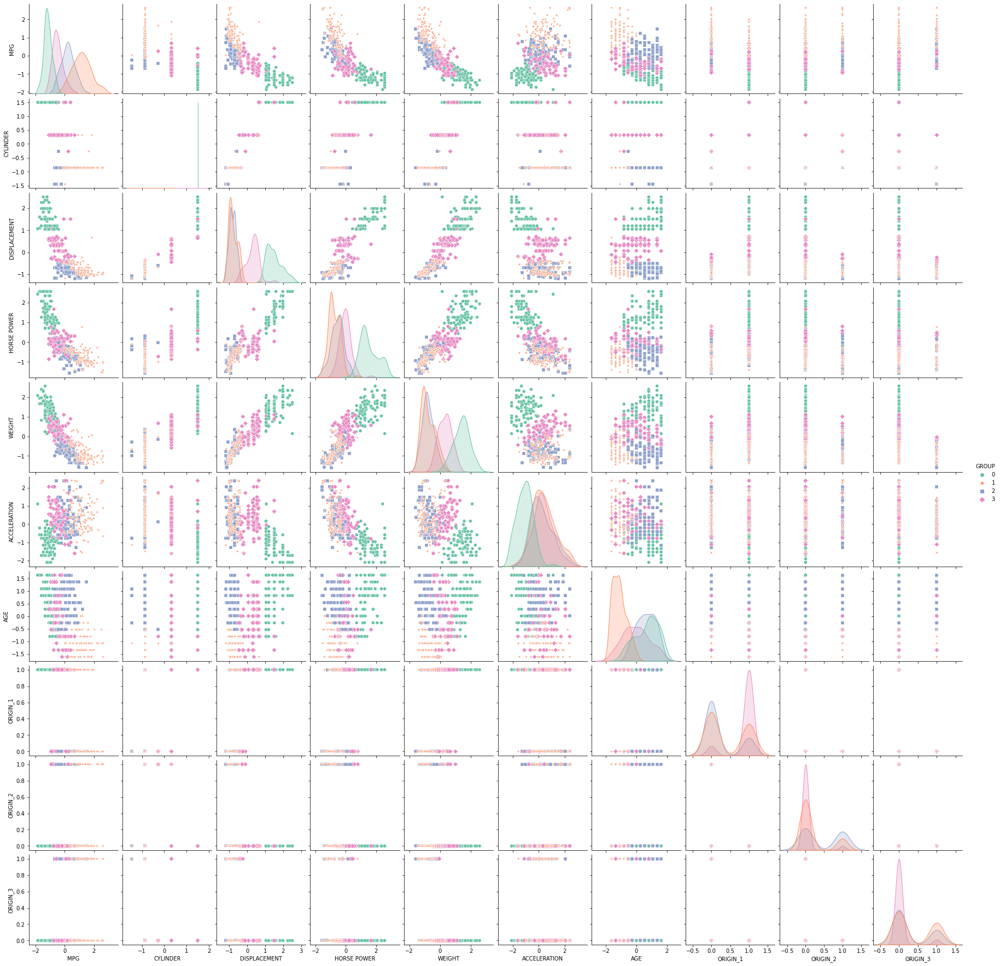

In [57]:
sns.pairplot(CARS, hue = "GROUP", diag_kind = "kde",kind = "scatter", markers=["o", "*", "s", "D"],palette = "Set2")

plt.show()

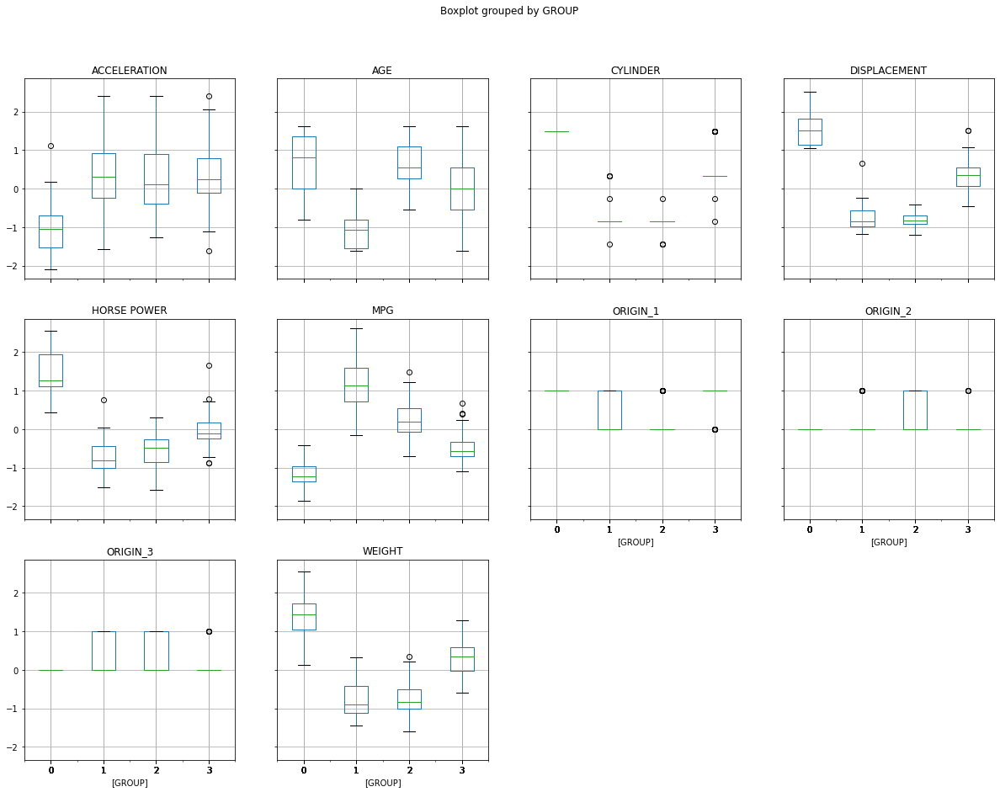

In [58]:
CARS.boxplot(by = 'GROUP', layout = (3,4), figsize = (20,15))

plt.show()

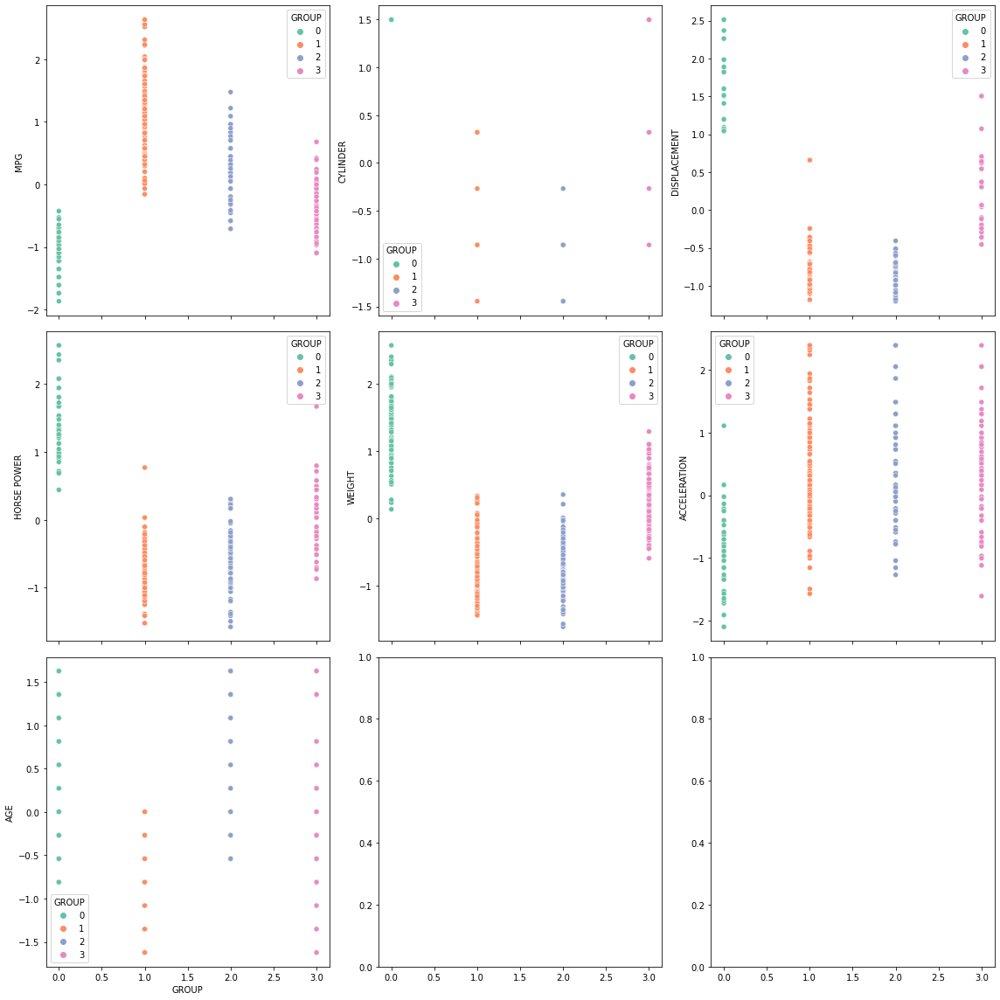

In [59]:
COLS = CARS.drop(['ORIGIN_1','ORIGIN_2','ORIGIN_3','GROUP'],axis = 1).columns

fig, ax = plt.subplots(3, 3, sharex=True, figsize=(16,16))
x=0
y=0

for i in COLS:
    sns.scatterplot(y = CARS[i], x = CARS['GROUP'], ax = ax[x, y], palette="Set2", markers=["o", "*", "s", "D"], hue = CARS['GROUP'])
    y = y+1
    if y == 3:
        x=x+1
        y=0

fig.tight_layout()
plt.show()

# G. Pass a new DataPoint and predict which cluster it belongs to.

    *WE ARE CREATING THE STRUCT THAT CONTAINS THE DIFFERENT DATA POINTS WE WANT TO TEST THE MODEL.
    *WE WILL CREATE A DATAFRAME OF 6 NEW DATA POINTS AND TEST THEM AGAINST THE MODEL.
    *INSTEAD OF A SINGLE DATA POINT, I AM TAKING 6 DATA POINTS AND PREDICT THEM AGAINST THE MODEL
    *WE WILL CHECK WHETHER THE TRAINED MODEL WILL CLUSTER THE DATA INTO THE 4 GROUPS THAT WERE CREATED EARLIER.

In [60]:
DATA_POINTS = {'NAME':['honda amaze','ford titanium','hyundai verna','maruti alto','fiat punto','tata tiago'],
                       'MPG':[19,15,16,18,17,19],'CYLINDER':[8,6,7,5,6,6],
                       'DISPLACEMENT':[352,305,333,256,323,278],
                       'HORSE POWER':[195,155,179,106,159,173],
                       'WEIGHT':[3528,2907,3256,2347,3147,2853],
                       'ACCELERATION':[12.3,10.2,11.6,8.9,11.8,13.5],
                       'MODEL YEAR':[82,79,81,76,80,82],'ORIGIN':[3,1,2,3,2,1]}
                       
TESTING_DATA = pd.DataFrame(DATA_POINTS)

TEST_DATA_POINTS = TESTING_DATA.copy()

In [61]:
TESTING_DATA

,NAME,MPG,CYLINDER,DISPLACEMENT,HORSE POWER,WEIGHT,ACCELERATION,MODEL YEAR,ORIGIN
0,honda amaze,19,8,352,195,3528,12.3,82,3
1,ford titanium,15,6,305,155,2907,10.2,79,1
2,hyundai verna,16,7,333,179,3256,11.6,81,2
3,maruti alto,18,5,256,106,2347,8.9,76,3
4,fiat punto,17,6,323,159,3147,11.8,80,2
5,tata tiago,19,6,278,173,2853,13.5,82,1


In [62]:
# ONE-HOT ENCODING THE COLUMN ORIGIN AND CREATE THRE VARIABLES ORIGIN_1,ORIGIN_2,ORIGIN_3
OHEC_TEST = pd.get_dummies(TESTING_DATA['ORIGIN'])
OHEC_TEST = OHEC_TEST.add_prefix('ORIGIN_')

# JOIN THE THREE NEW VARIABLES ORIGIN_1,ORIGIN_2,ORIGIN_3 TO THE OUR DATA FRAME C
TESTING_DATA = TESTING_DATA.join(OHEC_TEST)

In [63]:
# CALCULATE THE AGE OF THE NEW CARS IN THE TESTING DATA
TESTING_DATA['AGE'] = 83 - TESTING_DATA['MODEL YEAR']

# DROP THE COLUMNS THAT ARE NOT ESSENTIAL FOR TESTING THE MODEL.
TESTING_DATA = TESTING_DATA.drop(['MODEL YEAR','ORIGIN','NAME'],axis = 1)

TESTING_DATA[COLS] = StandardScaler().fit_transform(TESTING_DATA[COLS])

In [64]:
print(KMEAN.fit(TESTING_DATA))

KMeans(n_clusters=4, random_state=16384)


In [65]:
ERRORS_TEST = []
LABELS_TEST = KMEAN.labels_
CENTROIDS_TESTING = KMEAN.cluster_centers_
COUNT_TEST = np.bincount(LABELS_TEST[LABELS_TEST>=0])
CEN_DF_TEST = pd.DataFrame(CENTROIDS_TESTING, columns = list(TESTING_DATA))
CEN_DF_TEST

,MPG,CYLINDER,DISPLACEMENT,HORSE POWER,WEIGHT,ACCELERATION,ORIGIN_1,ORIGIN_2,ORIGIN_3,AGE
0,-0.894427,2.960595e-16,0.382768,0.113278,0.262010,-0.124035,0.333333,0.666667,0.0,0.000000
1,0.447214,-1.414214e+00,-1.587210,-1.973422,-1.780947,-1.680107,0.000000,0.000000,1.0,1.921538
2,1.118034,-3.535534e-01,-0.913539,0.423302,-0.414174,1.432037,1.000000,0.000000,0.0,-0.960769
3,1.118034,1.767767e+00,1.352446,1.210286,1.409091,0.620174,0.000000,0.000000,1.0,-0.960769


In [66]:
# CREATE THE GROUPS BASED ON 4 CLUSTERS

GROUPS_TEST = KMEAN.predict(TESTING_DATA)

# ADD THE GROUPS TO THE TESTING_DATA DATA FRAME CREATED


TEST_DATA_POINTS['GROUP'] = GROUPS_TEST

TEST_DATA_POINTS['GROUP'] = TEST_DATA_POINTS['GROUP'].astype('category')

In [67]:
TEST_DATA_POINTS

,NAME,MPG,CYLINDER,DISPLACEMENT,HORSE POWER,WEIGHT,ACCELERATION,MODEL YEAR,ORIGIN,GROUP
0,honda amaze,19,8,352,195,3528,12.3,82,3,3
1,ford titanium,15,6,305,155,2907,10.2,79,1,0
2,hyundai verna,16,7,333,179,3256,11.6,81,2,0
3,maruti alto,18,5,256,106,2347,8.9,76,3,1
4,fiat punto,17,6,323,159,3147,11.8,80,2,0
5,tata tiago,19,6,278,173,2853,13.5,82,1,2


    * WE HAVE CREATED 6 DATA POINTS TO TEST IN WHICH CLUSTERS THE NEW TEST DATA POINTS FITS INTO
    * 3 OF THE CARS FITTED INTO CLUSTER 0, AND REMAINING EACH ONE OF THE CARS FITTED INT0 CLUSTER 1,2,3
    * WE CAN SEE THAT OUR MODEL IS ABLE TO PREDICT AND GROUP THE NEW DATA POINTS PASSED FOR GROUPING

# PART B

# DOMAIN: Automobile

# • CONTEXT: The purpose is to classify a given silhouette as one of three types of vehicle, using a set of features extracted from the silhouette. The vehicle may be viewed from one of many different angles.

# • DATA DESCRIPTION: The data contains features extracted from the silhouette of vehicles in different angles. Four "Corgie" model vehicles were used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This particular combination of vehicles was chosen with the expectation that the bus, van and either one of the cars would be readily distinguishable, but it would be more difficult to distinguish between the cars.

# • All the features are numeric i.e. geometric features extracted from the silhouette.

# • PROJECT OBJECTIVE: Apply dimensionality reduction technique – PCA and train a model and compare relative results.

# 1. Data Understanding & Cleaning:

# A. Read ‘vehicle.csv’ and save as DataFrame.

In [68]:
VEHICLE = pd.read_csv("vehicle.csv")

In [69]:
print("FIRST FIVE ROWS IN THE VEHICLE DATA FRAME:\n")
VEHICLE.head()

FIRST FIVE ROWS IN THE VEHICLE DATA FRAME:



,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [70]:
print("LAST FIVE ROWS IN THE VEHICLE DATA FRAME:\n")
VEHICLE.tail()

LAST FIVE ROWS IN THE VEHICLE DATA FRAME:



,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
841,93,39.0,87.0,183.0,64.0,8,169.0,40.0,20.0,134,200.0,422.0,149.0,72.0,7.0,25.0,188.0,195,car
842,89,46.0,84.0,163.0,66.0,11,159.0,43.0,20.0,159,173.0,368.0,176.0,72.0,1.0,20.0,186.0,197,van
843,106,54.0,101.0,222.0,67.0,12,222.0,30.0,25.0,173,228.0,721.0,200.0,70.0,3.0,4.0,187.0,201,car
844,86,36.0,78.0,146.0,58.0,7,135.0,50.0,18.0,124,155.0,270.0,148.0,66.0,0.0,25.0,190.0,195,car
845,85,36.0,66.0,123.0,55.0,5,120.0,56.0,17.0,128,140.0,212.0,131.0,73.0,1.0,18.0,186.0,190,van


In [71]:
print("DATA TYPES OF THE VEHICLE DF:\n",VEHICLE.dtypes)

DATA TYPES OF THE VEHICLE DF:
 compactness                      int64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio          int64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity        int64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                    int64
class                           object
dtype: object


    *EXCEPT THE CLASS COLUMN, ALL THE REMAINING COLUMNS ARE NUMERICAL DATA.

In [72]:
VEHICLE.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

In [73]:
VEHICLE.describe()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
count,846.000000,841.000000,842.000000,840.000000,844.000000,846.000000,845.000000,845.000000,843.000000,846.000000,843.000000,844.000000,844.000000,842.000000,840.000000,845.000000,845.000000,846.000000
mean,93.678487,44.828775,82.110451,168.888095,61.678910,8.567376,168.901775,40.933728,20.582444,147.998818,188.631079,439.494076,174.709716,72.447743,6.364286,12.602367,188.919527,195.632388
std,8.234474,6.152172,15.778292,33.520198,7.891463,4.601217,33.214848,7.816186,2.592933,14.515652,31.411004,176.666903,32.584808,7.486190,4.920649,8.936081,6.155809,7.438797
min,73.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.000000,59.000000,0.000000,0.000000,176.000000,181.000000
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,147.000000,33.000000,19.000000,137.000000,167.000000,318.000000,149.000000,67.000000,2.000000,5.000000,184.000000,190.250000
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,179.000000,363.500000,173.500000,71.500000,6.000000,11.000000,188.000000,197.000000
75%,100.000000,49.000000,98.000000,195.000000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,217.000000,587.000000,198.000000,75.000000,9.000000,19.000000,193.000000,201.000000
max,119.000000,59.000000,112.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,268.000000,135.000000,22.000000,41.000000,206.000000,211.000000


In [74]:
VEHICLE.shape

(846, 19)

In [75]:
VEHICLE['class'].value_counts()

car    429
bus    218
van    199
Name: class, dtype: int64

    * THE DATA FRAME CONTAINS OF 846 ROWS AND 19 COLUMNS
    * THERE ARE PRESENSE OF NULL VALUES IN SOME OF THE COLUMNS
    * GOING FURTHER WE NEED TO DEAL WITH THE NULL VALUES TO PERFORM TESTING ON THE DATA.
    * THERE ARE TOTAL 3 CLASSES CAR, BUS AND VAN.
    * THERE ARE 429 CARS, 218 BUS AND 199 VAN

# B. Check percentage of missing values and impute with correct approach.

    *HERE WE WILL CHECK FOR THE PRESENSE OF NULL VALUES IN THE DATA.
    *WE CAN EITHER PROCEED WITH REPLACING THE NULL VALUES WITH MEDIAN OR DROP ALL THE ROWS WITH NULL VALUES.
    *IN THIS CURRENT SCENARIO, WE WILL PROCEED WITH REPLACING THE NULL VALUES IN THE COLUMNS WITH MEDIAN.

In [76]:
COLUMNS = VEHICLE.columns

COLUMN_WITH_NULL = pd.DataFrame(columns = ['COLUMN_NAME','NULL_VALUES_COUNT'])

COLUMN_NAME = []
NULL_VALUES_COUNT = []

for i in COLUMNS:
    COUNT = VEHICLE[i].isnull().sum()
    if COUNT > 0:
        COLUMN_NAME.append(i)
        NULL_VALUES_COUNT.append(COUNT)

        
COLUMN_WITH_NULL = pd.DataFrame(list(zip(COLUMN_NAME,NULL_VALUES_COUNT)),columns = ['COLUMN_NAME','NULL_VALUES_COUNT'])

print('BELOW ARE THE COLUMNS WITH NULL VALUES AND THEIR COUNTS:\n\n', COLUMN_WITH_NULL)

print('\n\nTHERE ARE TOTAL OF',VEHICLE[VEHICLE.isnull().any(axis = 1)].shape[0],'ROWS WITH NULL VALUES IN THE VEHICLE DATA FRAME')

BELOW ARE THE COLUMNS WITH NULL VALUES AND THEIR COUNTS:

                     COLUMN_NAME  NULL_VALUES_COUNT
0                   circularity                  5
1          distance_circularity                  4
2                  radius_ratio                  6
3          pr.axis_aspect_ratio                  2
4                 scatter_ratio                  1
5                 elongatedness                  1
6        pr.axis_rectangularity                  3
7               scaled_variance                  3
8             scaled_variance.1                  2
9     scaled_radius_of_gyration                  2
10  scaled_radius_of_gyration.1                  4
11               skewness_about                  6
12             skewness_about.1                  1
13             skewness_about.2                  1


THERE ARE TOTAL OF 33 ROWS WITH NULL VALUES IN THE VEHICLE DATA FRAME


In [77]:
# WE ARE GOING TO REPLACE THE NULL VALUES WITH THE MEDIAN OF THE COLUMN

for i in COLUMN_WITH_NULL['COLUMN_NAME']:
    MEDIAN = VEHICLE[i].median()
    VEHICLE[i] = VEHICLE[i].fillna(MEDIAN)

In [78]:
if VEHICLE[i].isnull().sum() == 0:
    print('THERE ARE NO NULL VALUES IN THE DATASET AFTER IMPUTING WITH MEDIAN')
else:
    print('THERE ARE NULL VALUES PRESENT IN THE DATA SET. NEED TO IMPUTE FURTHER')

THERE ARE NO NULL VALUES IN THE DATASET AFTER IMPUTING WITH MEDIAN


# C. Visualize a Pie-chart and print percentage of values for variable ‘class’.

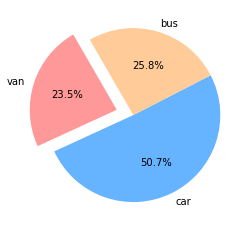

In [79]:
my_labels = VEHICLE['class'].unique()

colors = ['#ff9999','#66b3ff','#ffcc99']

my_explode = [0.2,0,0]

plt.pie(VEHICLE['class'].value_counts(sort = False),startangle=120,autopct='%1.1f%%',
        labels = my_labels,colors = colors,explode = my_explode)

#CIRCLE = plt.Circle( (0,0), 0.7, color='white')
#PLOT = plt.gcf()
#PLOT.gca().add_artist(CIRCLE)

plt.show()

    * CLASS COLUMN CONTAINS THREE TYPE OF VEHICLES : VAN, BUS, CARS
    * OUT OF THREE CLASS CAR HAS MORE ROWS AND VAN HAS LESS ROWS.
    * NO OF CARS ARE MORE THAN VAN AND BUS COMBINED.

# D. Check for duplicate rows in the data and impute with correct approach.

    * WE ARE GOING TO CHECK FOR DUPILICATE ROWS AND EITHER DROP THEM OR IMPUTE THEM.

In [80]:
ISDUPE = VEHICLE.duplicated().sum()

if ISDUPE==0:
    print('\n\nNO DUPLICATE VALUES ARE PRESENT IN THE DATA')
else:
    print('\n\nTHERE ARE DUPLICATE VALUES PRESENT IN THE DATA')



NO DUPLICATE VALUES ARE PRESENT IN THE DATA


    * THERE ARE NO DUPLICATE VALUES PRESENT IN THE DATA SET.

In [81]:
VEHICLE['class'] = VEHICLE['class'].astype('category')

In [82]:
VEHICLE.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.00,119.0
circularity,846.0,44.823877,6.134272,33.0,40.00,44.0,49.00,59.0
distance_circularity,846.0,82.100473,15.741569,40.0,70.00,80.0,98.00,112.0
radius_ratio,846.0,168.874704,33.401356,104.0,141.00,167.0,195.00,333.0
pr.axis_aspect_ratio,846.0,61.677305,7.882188,47.0,57.00,61.0,65.00,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.00,55.0
scatter_ratio,846.0,168.887707,33.197710,112.0,147.00,157.0,198.00,265.0
elongatedness,846.0,40.936170,7.811882,26.0,33.00,43.0,46.00,61.0
pr.axis_rectangularity,846.0,20.580378,2.588558,17.0,19.00,20.0,23.00,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.00,188.0


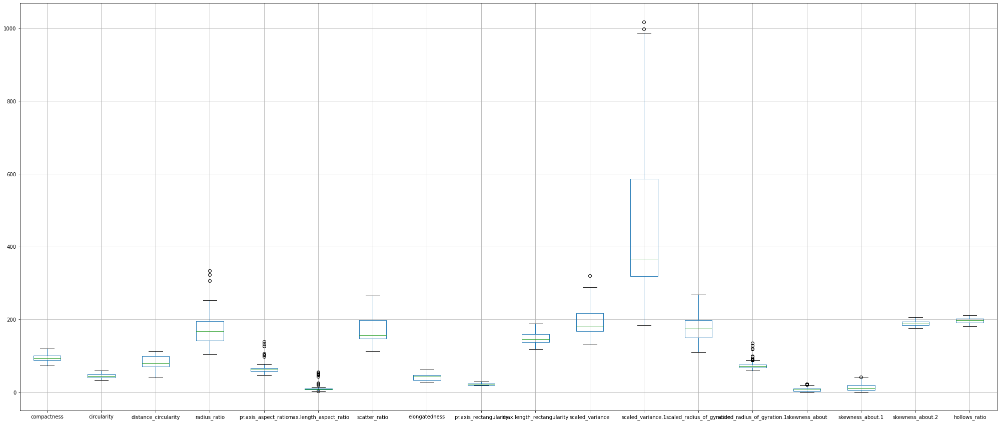

In [83]:
VEHICLE.boxplot(figsize=(35,15))

plt.show()

    * THERE ARE PRESENSE OF OUTLIERS IN THE DATA
    * WE WILL PROCEED WITH TREATING THE OUTLIERS USING A SUITABLE APPROACH.
    * BELOW ARE THE COLUMNS WITH OUTLIERS DATA
    * 'radius_ratio','pr.axis_aspect_ratio','max.length_aspect_ratio','scaled_variance', 
      'scaled_variance.1','scaled_radius_of_gyration.1','skewness_about','skewness_about.1'

In [84]:
COL_OL = ['radius_ratio','pr.axis_aspect_ratio','max.length_aspect_ratio','scaled_variance', 
          'scaled_variance.1','scaled_radius_of_gyration.1','skewness_about','skewness_about.1']

    # WE NEED TO CALCULATE THE QUARTILE 1 AND QUARTILE 3 AND USING THAT INTER QUARTILE RANGE
    # THEN WE WILL CALCULATE LOWER RANGE AND UPPER RANGE USING QUARTILE 1,3, IQR
    # AFTER THAT NEED TO REPLACE THE OUTLIERS THAT ARE BELOW LOWER RANGE AND ABOVE UPPER RANGE WITH MEDIAN.

for I in COL_OL:
    QRT1 = VEHICLE[I].quantile(0.25)
    QRT3 = VEHICLE[I].quantile(0.75)
    IQR = QRT3-QRT1
    LOWER = QRT1-1.5*IQR
    UPPER = QRT3+1.5*IQR
    VEHICLE.loc[(VEHICLE[I] < LOWER) | (VEHICLE[I] > UPPER), I] = VEHICLE[I].median()


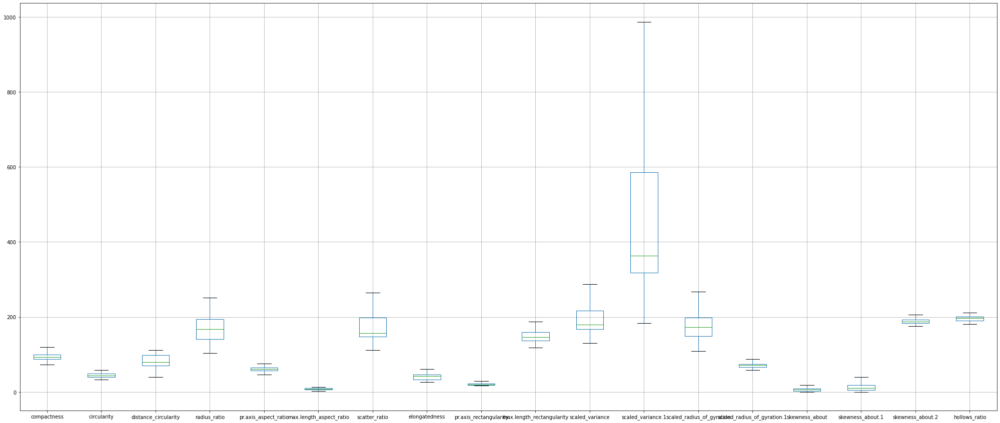

In [85]:
VEHICLE.boxplot(figsize=(35,15))

plt.show()

    * WE CAN SEE THAT NOW THE OUTLIERS ARE TOTALLY DEALT WITH.

In [86]:
VEHICLE.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.00,119.0
circularity,846.0,44.823877,6.134272,33.0,40.00,44.0,49.00,59.0
distance_circularity,846.0,82.100473,15.741569,40.0,70.00,80.0,98.00,112.0
radius_ratio,846.0,168.330969,32.147908,104.0,141.00,167.0,194.75,252.0
pr.axis_aspect_ratio,846.0,61.154846,5.613458,47.0,57.00,61.0,65.00,76.0
max.length_aspect_ratio,846.0,8.118203,2.064114,3.0,7.00,8.0,10.00,13.0
scatter_ratio,846.0,168.887707,33.197710,112.0,147.00,157.0,198.00,265.0
elongatedness,846.0,40.936170,7.811882,26.0,33.00,43.0,46.00,61.0
pr.axis_rectangularity,846.0,20.580378,2.588558,17.0,19.00,20.0,23.00,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.00,188.0


In [87]:
VEHICLE.corr()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
compactness,1.000000,0.684887,0.789928,0.721925,0.192864,0.499928,0.812620,-0.788750,0.813694,0.676143,0.769871,0.806170,0.585243,-0.246681,0.197308,0.156348,0.298537,0.365552
circularity,0.684887,1.000000,0.792320,0.638280,0.203253,0.560470,0.847938,-0.821472,0.843400,0.961318,0.802768,0.827462,0.925816,0.068745,0.136351,-0.009666,-0.104426,0.046351
distance_circularity,0.789928,0.792320,1.000000,0.794222,0.244332,0.666809,0.905076,-0.911307,0.893025,0.774527,0.869584,0.883943,0.705771,-0.229353,0.099107,0.262345,0.146098,0.332732
radius_ratio,0.721925,0.638280,0.794222,1.000000,0.650554,0.463958,0.769941,-0.825392,0.744139,0.579468,0.786183,0.760257,0.550774,-0.390459,0.035755,0.179601,0.405849,0.491758
pr.axis_aspect_ratio,0.192864,0.203253,0.244332,0.650554,1.000000,0.150295,0.194195,-0.298144,0.163047,0.147592,0.207101,0.196401,0.148591,-0.321070,-0.056030,-0.021088,0.400882,0.415734
max.length_aspect_ratio,0.499928,0.560470,0.666809,0.463958,0.150295,1.000000,0.490759,-0.504181,0.487931,0.642713,0.401391,0.463249,0.397397,-0.335444,0.081898,0.141664,0.083794,0.413174
scatter_ratio,0.812620,0.847938,0.905076,0.769941,0.194195,0.490759,1.000000,-0.971601,0.989751,0.809083,0.960883,0.980447,0.799875,0.011314,0.064242,0.211647,0.005628,0.118817
elongatedness,-0.788750,-0.821472,-0.911307,-0.825392,-0.298144,-0.504181,-0.971601,1.000000,-0.948996,-0.775854,-0.947644,-0.948851,-0.766314,0.078391,-0.046943,-0.183642,-0.115126,-0.216905
pr.axis_rectangularity,0.813694,0.843400,0.893025,0.744139,0.163047,0.487931,0.989751,-0.948996,1.000000,0.810934,0.947329,0.973606,0.796690,0.027545,0.073127,0.213801,-0.018649,0.099286
max.length_rectangularity,0.676143,0.961318,0.774527,0.579468,0.147592,0.642713,0.809083,-0.775854,0.810934,1.000000,0.750222,0.789632,0.866450,0.053856,0.130702,0.004129,-0.103948,0.076770


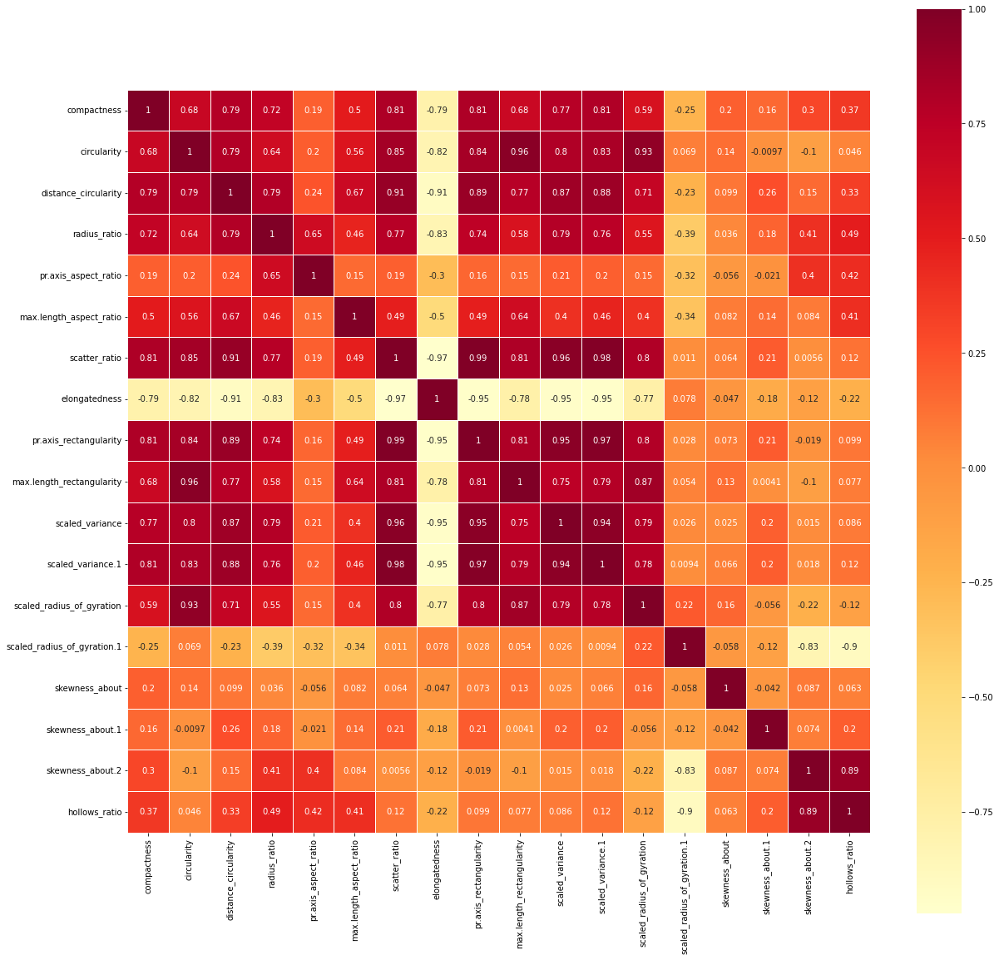

In [88]:
plt.figure(figsize = (20,20))

sns.heatmap(VEHICLE.drop(columns = 'class').corr(), annot = True, linewidths = 1, square = True, cmap="YlOrRd")

plt.show()

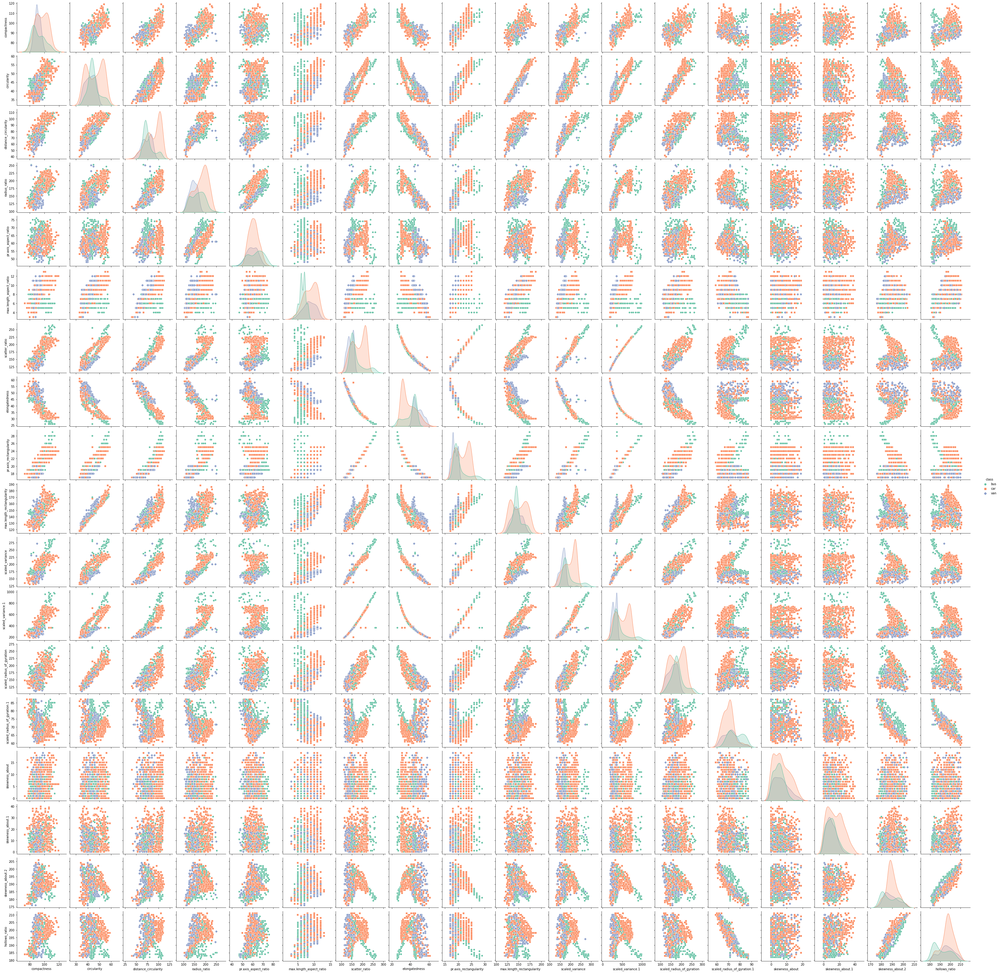

In [89]:
sns.pairplot(VEHICLE, hue = "class", diag_kind = "kde",kind = "scatter", markers=["o", "s", "D"],palette = "Set2")

plt.show()

In [90]:
VEHICLE['class']=LabelEncoder().fit_transform(VEHICLE['class'])

    * THROUGH LABEL ENCODING, WE HAVE CONVERTED THE CATEGORICAL VARIABLE.
    * 1 REPRESENTS CARS, 0 REPRESENTS BUS AND 2 REPRESENTS VAN.

# 2. Data Preparation:

# A. Split data into X and Y. [Train and Test optional]

In [91]:
# WE HAVE SPLIT THE DATA INTO X AND Y. WHERE Y CONTAINS THE DEPENDENT VARIABLE AND X CONTAINS INDEPENDENT VARIABLE

X = VEHICLE.drop(columns = 'class')

Y = VEHICLE['class']

In [92]:
# WE ARE GOING TO SPLIT THE DATA INTO TRAIN AND TEST DATA.

X_TRAIN, X_TEST, Y_TRAIN, Y_TEST = train_test_split(X,Y,test_size = 0.3, random_state = 10)

# B. Standardize the Data.

In [93]:
# WE ARE GOING TO STANDARDIZE THE DATA BY APPLYING Z_SCORE ON INDEPENDENT VARIABLES.

X_STD = X.apply(zscore)

In [94]:
# WE ARE GOING TO SPLIT THE DATA INTO TRAIN AND TEST DATA AGAIN AFTER STANDARDISING THE DATA.

X_TRAIN, X_TEST, Y_TRAIN, Y_TEST = train_test_split(X_STD,Y,test_size = 0.3, random_state = 10)

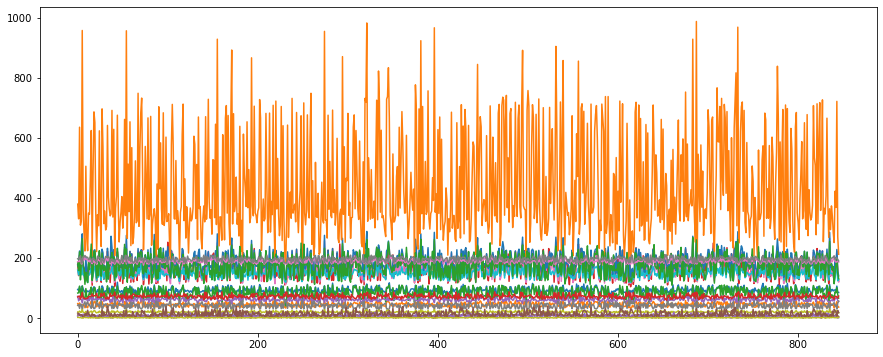

In [95]:
fig = plt.figure(figsize=(15,6))

plt.plot(VEHICLE)

plt.show()

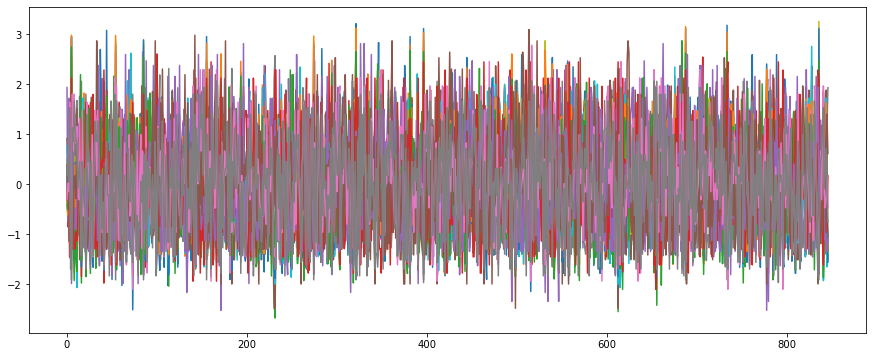

In [96]:
fig = plt.figure(figsize=(15,6))

plt.plot(X_STD)

plt.show()

    * FROM THE ABOVE PLOTS, WE CAN SEE THAT AFTER STANDARDIZING, SCALE OF THE VARIABLES CAME DOWN TO VERY LOW VALUES.

# 3. Model Building:

# A. Train a base Classification model using SVM.

In [97]:
from sklearn.svm import SVC
import sklearn.metrics as metrics
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score

MODEL_TYPE = []
MODEL_TYPE.append(('SVM-LINEAR', SVC(kernel='linear',C=1,gamma=.6)))
MODEL_TYPE.append(('SVM-POLY', SVC(kernel='rbf',degree=2,C=.009)))
MODEL_TYPE.append(('SVM-RBF', SVC(kernel='poly',degree=2,gamma=0.1,C=.01)))

RESULTS = pd.DataFrame()

for name, model in MODEL_TYPE:
    MODEL_EVAL = model
    MODEL_EVAL.fit(X_TRAIN, Y_TRAIN)
    Y_PRED = MODEL_EVAL.predict(X_TEST)
    ACCURACY = accuracy_score(Y_TEST, Y_PRED)
    PRECISION = precision_score(Y_TEST, Y_PRED,average='weighted')
    RECALL = recall_score(Y_TEST, Y_PRED,average='weighted')
    F1_SCORE = f1_score(Y_TEST, Y_PRED,average='weighted')
    RESULTS = RESULTS.append(pd.Series([name,ACCURACY,PRECISION,RECALL,F1_SCORE]),ignore_index=True)
    
RESULTS.columns = ['MODEL_NAME','ACCURACY','PRECISION','RECALL','F1-SCORE']

print(RESULTS)

   MODEL_NAME  ACCURACY  PRECISION    RECALL  F1-SCORE
0  SVM-LINEAR  0.933071   0.935659  0.933071  0.933162
1    SVM-POLY  0.492126   0.242188  0.492126  0.324621
2     SVM-RBF  0.515748   0.527575  0.515748  0.373406


    * WE HAVE RUN THE SVM MODEL USING LINEAR, POLY AND RBF
    * SVM_LINEAR MODEL IS SHOWN TO PERFORM BEST OUT OF OTHER TWO MODELS.
    * WE WILL PROCEED TO USE THE LINEAR MODEL AND PRINT THE SCORES FOR TRAIN AND TEST DATA

In [98]:
SVM_MODEL = SVC(kernel='linear',C=1,gamma=.6)

SVM_MODEL.fit(X_TRAIN, Y_TRAIN)

PREDICTION = SVM_MODEL.predict(X_TEST)

print('ACCURACY ON TRAIN DATA:',SVM_MODEL.score(X_TRAIN,Y_TRAIN))

print('\n\nACCURACY ON TEST DATA:',SVM_MODEL.score(X_TEST,Y_TEST))

ACCURACY ON TRAIN DATA: 0.9577702702702703


ACCURACY ON TEST DATA: 0.9330708661417323


    * WE COULD SEE THAT TRAIN DATA ACCURACY IS ABOVE 95% AND TEST DATA ABOVE 93%
    * SVM LINEAR MODEL BEST FIT THE DATA.

# B. Print Classification metrics for train data.

In [99]:
print(classification_report(Y_TEST,PREDICTION),'\n')

              precision    recall  f1-score   support

           0       0.93      0.94      0.94        71
           1       0.97      0.90      0.93       125
           2       0.88      0.98      0.93        58

    accuracy                           0.93       254
   macro avg       0.92      0.94      0.93       254
weighted avg       0.94      0.93      0.93       254
 



# C. Apply PCA on the data with 10 components.

In [100]:
from sklearn.decomposition import PCA

PCA_DATA = PCA(n_components=10)
PCA_X = PCA_DATA.fit_transform(X_STD)

In [101]:
PCA_DF = pd.DataFrame(data = PCA_DATA.components_, columns = list(X_STD))

PCA_DF

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,0.272503,0.287255,0.302421,0.269714,0.097861,0.195200,0.310524,-0.309007,0.307287,0.278154,0.299765,0.305532,0.263238,-0.041936,0.036083,0.058720,0.038013,0.084740
1,-0.087044,0.131622,-0.046143,-0.197931,-0.257840,-0.108046,0.075285,-0.013230,0.087560,0.122154,0.077266,0.071503,0.210582,0.503622,-0.015766,-0.092746,-0.501621,-0.507612
2,-0.038185,-0.201147,0.063462,0.056285,-0.061993,-0.148958,0.109043,-0.090853,0.106070,-0.213685,0.144600,0.110344,-0.202870,0.073864,-0.559174,0.670680,-0.062241,-0.041705
3,0.138675,-0.038055,0.108954,-0.254355,-0.612766,0.278678,0.005393,0.065215,0.030899,0.041467,-0.064005,-0.002197,-0.085540,-0.115400,0.473703,0.428426,-0.027410,0.096037
4,0.137101,-0.138996,-0.080017,0.133744,0.123601,-0.634893,0.085557,-0.079073,0.081646,-0.251113,0.147471,0.110101,-0.005212,0.138069,0.566552,0.130870,0.180519,-0.110788
5,0.263611,-0.071347,-0.016901,-0.138184,-0.577829,-0.289097,0.097747,-0.075728,0.105403,-0.078196,0.132912,0.115398,-0.067057,-0.131513,-0.319176,-0.468405,0.280136,0.059444
6,0.202717,-0.392275,0.163371,0.161911,0.092763,0.398266,0.092352,-0.104071,0.093132,-0.354564,0.068055,0.090119,-0.455293,0.085823,0.124532,-0.302518,-0.258250,-0.173269
7,-0.758796,-0.067603,0.277372,0.110545,-0.186859,-0.046219,0.064620,-0.192343,0.013868,-0.215163,0.195679,0.037795,0.146753,-0.330395,0.114255,-0.115404,-0.094660,-0.006497
8,0.366686,0.055326,0.074678,0.266667,-0.038630,-0.137163,-0.131568,0.289634,-0.089529,-0.158232,0.042703,-0.151073,0.263771,-0.555267,-0.059904,0.052385,-0.379169,-0.280341
9,-0.160045,0.182324,-0.273034,0.050599,0.034304,-0.177961,0.143133,0.079383,0.239897,0.382739,-0.166091,0.287458,-0.549627,-0.362547,0.057989,-0.012900,-0.187849,-0.133403


In [102]:
COV_MX = np.cov(X_STD.T)

EIGEN_VALUES, EIGEN_VECTORS = np.linalg.eig(COV_MX)

In [103]:
print(EIGEN_VALUES)

[9.74940269e+00 3.35071912e+00 1.19238155e+00 1.13381916e+00
 8.83997312e-01 6.66265745e-01 3.18150910e-01 2.28179142e-01
 1.31018595e-01 7.98619108e-02 7.33979478e-02 6.46162669e-02
 5.16287320e-03 4.01448646e-02 1.98136761e-02 2.27005257e-02
 3.22758478e-02 2.93936408e-02]


In [104]:
print(EIGEN_VECTORS)

[[-2.72502890e-01 -8.70435783e-02  3.81852075e-02  1.38675013e-01
  -1.37101466e-01  2.63611383e-01  2.02717114e-01 -7.58796410e-01
   3.66685918e-01  1.60045219e-01  8.40252779e-02  2.14645175e-02
  -1.87350749e-02  6.89082276e-02  4.26105276e-02  9.97784975e-02
  -8.22590084e-02 -3.30366937e-02]
 [-2.87254690e-01  1.31621757e-01  2.01146908e-01 -3.80554832e-02
   1.38995553e-01 -7.13474241e-02 -3.92275358e-01 -6.76034223e-02
   5.53261885e-02 -1.82323962e-01 -3.65229874e-02  1.47247511e-01
  -4.89102355e-02  5.90534770e-02 -6.74107885e-01  1.63466948e-01
  -2.59100771e-01  2.48832011e-01]
 [-3.02421105e-01 -4.61430061e-02 -6.34621085e-02  1.08954287e-01
   8.00174278e-02 -1.69006151e-02  1.63371282e-01  2.77371950e-01
   7.46784853e-02  2.73033778e-01  4.68505530e-01  6.52730855e-01
   4.74162132e-03 -1.62108150e-01 -4.99754439e-04 -6.36582307e-02
   1.20629778e-01  9.80561531e-02]
 [-2.69713545e-01 -1.97931263e-01 -5.62851689e-02 -2.54355087e-01
  -1.33744367e-01 -1.38183653e-01  1.

In [105]:
PCA_REDUCED = np.array(EIGEN_VECTORS[0:10])

X_STD_10 = np.dot(X_STD,PCA_REDUCED.T)

PCA_DIM10 = pd.DataFrame(X_STD_10)

PCA_DIM10.head()

,0,1,2,3,4,5,6,7,8,9
0,-0.187067,0.291304,-0.109543,-0.341230,-1.366761,1.109115,0.031458,-0.007252,-0.590437,0.083418
1,-0.578067,-0.165120,-0.783569,0.796478,0.188025,-0.690496,-0.230511,-0.823160,0.146608,0.214858
2,1.642473,-1.488873,1.056498,-1.066004,-1.230999,0.432837,0.484535,0.679934,-1.254475,0.788387
3,-1.200693,0.086752,-0.357946,1.211271,-0.644191,0.329381,-1.499561,0.876219,0.613940,0.174215
4,-0.067616,-0.374246,0.477125,-1.266510,-0.158059,-0.413354,1.407978,-1.152164,1.226641,0.455983


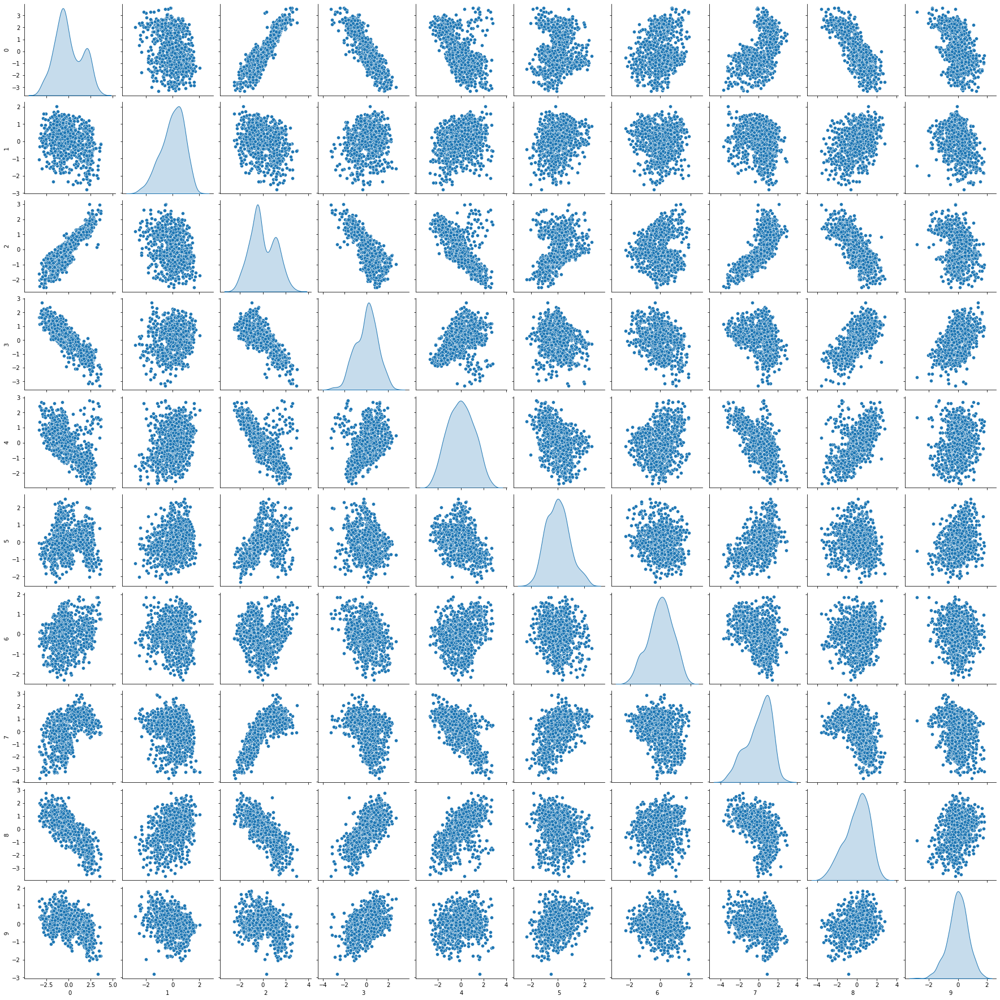

In [152]:
sns.pairplot(PCA_DIM10,diag_kind = "kde",palette = "Set2")

plt.show()

# D. Visualize Cumulative Variance Explained with Number of Components.

In [106]:
# FIRST WE WILL FIND OUT THE VARIANCE AND CUMULATIVE VARIANCE

TOTAL = sum(EIGEN_VALUES)
VAR = [( i /TOTAL ) * 100 for i in sorted(EIGEN_VALUES, reverse=True)]
C_VAR = np.cumsum(VAR)
print("CUMULATIVE VARIANCE", C_VAR)

CUMULATIVE VARIANCE [ 54.0993254   72.69242795  79.30893968  85.60048941  90.50578051
  94.2028816   95.96829741  97.23446089  97.96148159  98.40463444
  98.81191882  99.17047375  99.39323715  99.57233547  99.73544045
  99.86140541  99.97135127 100.        ]


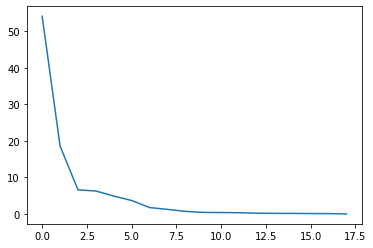

In [107]:
plt.plot(VAR)

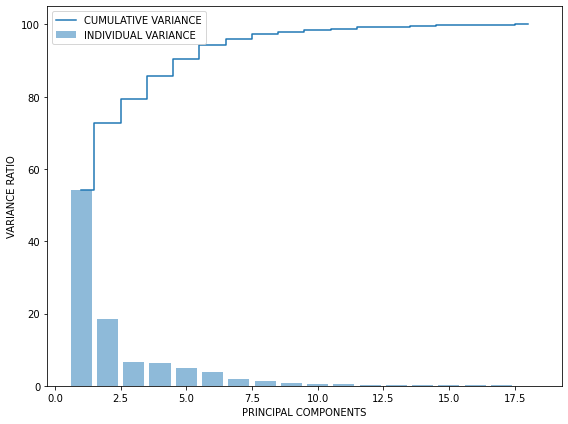

In [108]:
plt.figure(figsize=(8 , 6))
plt.bar(range(1, EIGEN_VALUES.size + 1), VAR, alpha = 0.5, align = 'center', label = 'INDIVIDUAL VARIANCE')
plt.step(range(1, EIGEN_VALUES.size + 1), C_VAR, where='mid', label = 'CUMULATIVE VARIANCE')
plt.ylabel('VARIANCE RATIO')
plt.xlabel('PRINCIPAL COMPONENTS')
plt.legend(loc = 'best')
plt.tight_layout()
plt.show()

# E. Draw a horizontal line on the above plot to highlight the threshold of 90%.

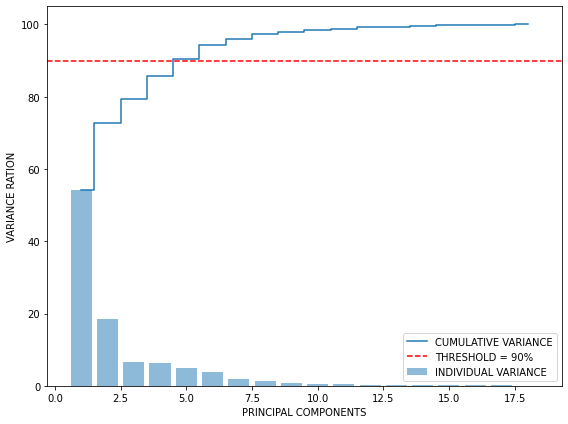

In [109]:
plt.figure(figsize=(8 , 6))
plt.bar(range(1, EIGEN_VALUES.size + 1), VAR, alpha = 0.5, align = 'center', label = 'INDIVIDUAL VARIANCE')
plt.step(range(1, EIGEN_VALUES.size + 1), C_VAR, where='mid', label = 'CUMULATIVE VARIANCE')
plt.axhline(y = 90, color = 'r', linestyle = 'dashed', label = "THRESHOLD = 90%")
plt.ylabel('VARIANCE RATION')
plt.xlabel('PRINCIPAL COMPONENTS')
plt.legend(loc = 'best')
plt.tight_layout()
plt.show()

    * IN THE ABOVE PLOT A DASHED RED LINE IS DRAWN ACROSS THE PLOT THAT REPRESENTS THE THRESHOLD OF 90%
    
    * AT THE POINT WHERE THE LINE CUTS THE CUMULATIVE VARIANCE, WE CAN SEE THAT 5 PRINCIPLE COMPONENTS
        ARE ENOUGH TO BE AT 90% THRESHOLD.

# F. Apply PCA on the data. This time Select Minimum Components with 90% or above variance explained.

In [110]:
PCA_6D = PCA(n_components=6)
PCA_DATA_6D = PCA_6D.fit_transform(X_STD)
PCA_X_6D = pd.DataFrame(PCA_6D.components_,columns=list(X_STD))
P_6D = np.array(EIGEN_VECTORS[0:6])   
X_STD_6D = np.dot(X_STD,P_6D.T)   
PCA_DIM6 = pd.DataFrame(X_STD_6D)
X_TRAIN_6D, X_TEST_6D, Y_TRAIN_6D, Y_TEST_6D = train_test_split(PCA_DIM6, Y, test_size = 0.3, random_state = 10)

    * FROM THE ABOVE PLOT, WE CAN SEE THAT 90% THRESHOLD CROSS THROUGH THE 5 COMPONENTS
    
    * WE CAN SELECT 6 COMPONENTS WHERE THE THRESHOLD IS CROSSING ABOVE 90%

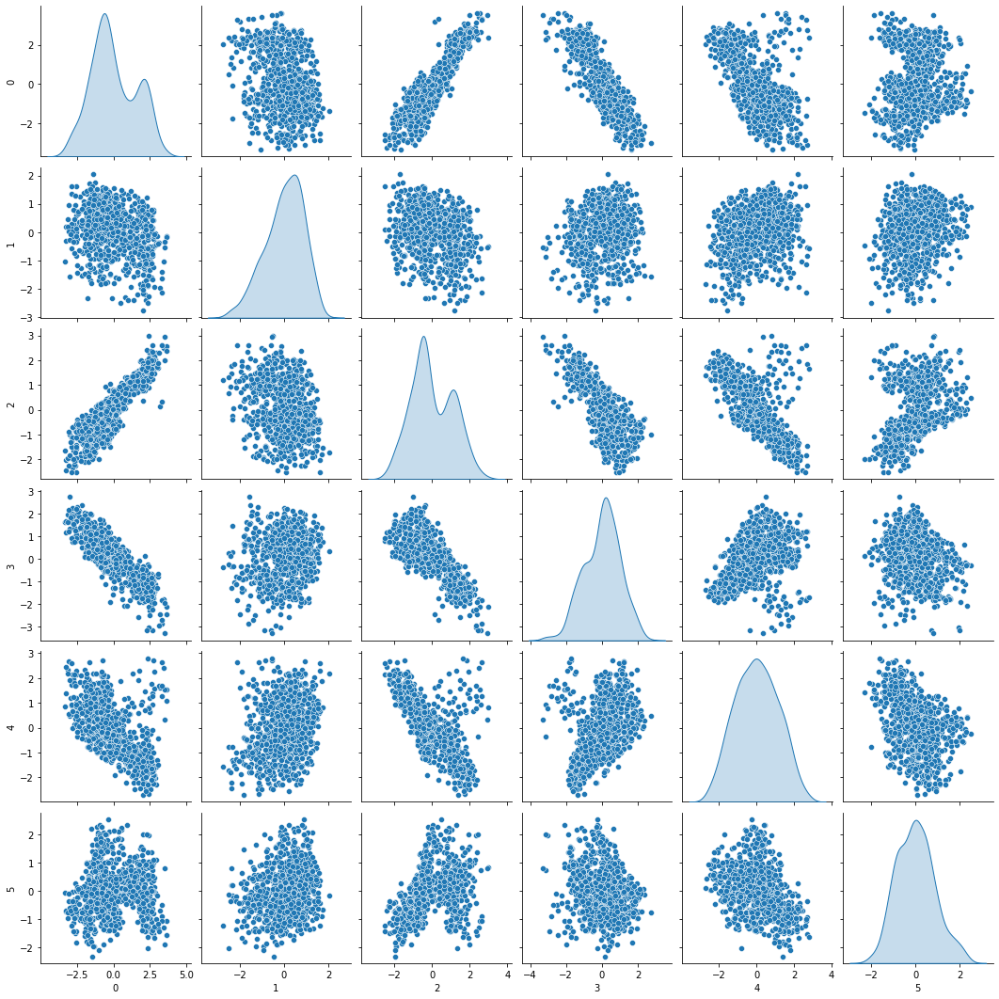

In [151]:
sns.pairplot(PCA_DIM6,diag_kind = "kde",palette = "Set2")

plt.show()

# G. Train SVM model on components selected from above step.

In [111]:
MODEL_TYPE = []
MODEL_TYPE.append(('SVM-LINEAR', SVC(kernel='linear',C=1,gamma=.6)))
MODEL_TYPE.append(('SVM-POLY', SVC(kernel='rbf',degree=2,C=.009)))
MODEL_TYPE.append(('SVM-RBF', SVC(kernel='poly',degree=2,gamma=0.1,C=.01)))

RESULTS = pd.DataFrame()

for name, model in MODEL_TYPE:
    MODEL_EVAL = model
    MODEL_EVAL.fit(X_TRAIN_6D, Y_TRAIN_6D)
    Y_PRED = MODEL_EVAL.predict(X_TEST_6D)
    ACCURACY = accuracy_score(Y_TEST_6D, Y_PRED)
    PRECISION = precision_score(Y_TEST_6D, Y_PRED,average='weighted')
    RECALL = recall_score(Y_TEST_6D, Y_PRED,average='weighted')
    F1_SCORE = f1_score(Y_TEST_6D, Y_PRED,average='weighted')
    RESULTS = RESULTS.append(pd.Series([name,ACCURACY,PRECISION,RECALL,F1_SCORE]),ignore_index=True)
    
RESULTS.columns = ['MODEL_NAME','ACCURACY','PRECISION','RECALL','F1-SCORE']

print(RESULTS)

   MODEL_NAME  ACCURACY  PRECISION    RECALL  F1-SCORE
0  SVM-LINEAR  0.803150   0.807035  0.803150  0.804094
1    SVM-POLY  0.492126   0.242188  0.492126  0.324621
2     SVM-RBF  0.492126   0.242188  0.492126  0.324621


In [112]:
SVM_MODEL = SVC(kernel='linear',C=1,gamma=.6)

SVM_MODEL.fit(X_TRAIN_6D, Y_TRAIN_6D)

PREDICTION = SVM_MODEL.predict(X_TEST_6D)

print('ACCURACY ON TRAIN DATA AFTER APPLYING PCA:',SVM_MODEL.score(X_TRAIN_6D,Y_TRAIN_6D))

print('\n\nACCURACY ON TEST DATA AFTER APPLYING PCA:',SVM_MODEL.score(X_TEST_6D,Y_TEST_6D))

ACCURACY ON TRAIN DATA AFTER APPLYING PCA: 0.8378378378378378


ACCURACY ON TEST DATA AFTER APPLYING PCA: 0.8031496062992126


# H. Print Classification metrics for train data of above model and share insights.

In [113]:
print(classification_report(Y_TEST_6D,PREDICTION),'\n')

              precision    recall  f1-score   support

           0       0.85      0.82      0.83        71
           1       0.82      0.79      0.81       125
           2       0.71      0.81      0.76        58

    accuracy                           0.80       254
   macro avg       0.80      0.81      0.80       254
weighted avg       0.81      0.80      0.80       254
 



    * WE HAVE SELECTED ONLY 6 COMPONENTS THAT CAN BE USED TO ACHIEVE 90% OF MODEL ACCURACY OVER THE EARLIER MODEL
    * ON REDUCING THE COMPONENTS, WE CAN SEE THAT ACCURACY, PRECISION, RECALL, F1-SCORE GOT REDUCED.
    * STILL THE MODEL IS HAVING ACCURACY OF 83.7% ON TEST DATA AND 80.3% ON TEST DATA.

# 4. Performance Improvement:

# A. Train another SVM on the components out of PCA. Tune the parameters to improve performance.

In [114]:
PCA_FINAL = PCA(n_components=18)
PCA_X_FINAL = PCA_FINAL.fit_transform(X_STD)
PCA_FINAL_DF = pd.DataFrame(data = PCA_X_FINAL, columns = list(X_STD))
COV_MX_FINAL = np.cov(X_STD.T)
EIGEN_VALUES_FIN, EIGEN_VECTORS_FIN = np.linalg.eig(COV_MX_FINAL)
PCA_RESULTS = pd.DataFrame()

for i in np.arange(1,19,1):
    PCA_MIN = np.array(EIGEN_VECTORS_FIN[0:i])   
    X_STD_D = np.dot(X_STD,PCA_MIN.T)   
    PCA_DF_FIN = pd.DataFrame(X_STD_D)
    X_TRAIN_PCA, X_TEST_PCA, Y_TRAIN_PCA, Y_TEST_PCA = train_test_split(PCA_DF_FIN, Y, test_size = 0.3, random_state = 10)
    SVM_MODEL = SVC(kernel='linear',C=1,gamma=.6)
    SVM_MODEL.fit(X_TRAIN_PCA, Y_TRAIN_PCA)
    PREDICTION = SVM_MODEL.predict(X_TEST_PCA)
    TRAIN_ACC = SVM_MODEL.score(X_TRAIN_PCA,Y_TRAIN_PCA)
    TEST_ACC = SVM_MODEL.score(X_TEST_PCA,Y_TEST_PCA)
    PCA_RESULTS = PCA_RESULTS.append(pd.Series([i,TRAIN_ACC,TEST_ACC]),ignore_index=True)
    
PCA_RESULTS.columns = ['NO. OF PRINCIPAL COMPONENTS', 'TRAINING ACCURACY','TESTING ACCURACY']

In [115]:
print('COMPARING MODEL PERFORMANCE AT SELECTION OF DIFFERENT PRINCIPLE COMPONENTS:\n')
print('***************************************************************************\n')
print(PCA_RESULTS)

COMPARING MODEL PERFORMANCE AT SELECTION OF DIFFERENT PRINCIPLE COMPONENTS:

***************************************************************************

    NO. OF PRINCIPAL COMPONENTS  TRAINING ACCURACY  TESTING ACCURACY
0                           1.0           0.559122          0.515748
1                           2.0           0.565878          0.523622
2                           3.0           0.572635          0.531496
3                           4.0           0.709459          0.696850
4                           5.0           0.807432          0.775591
5                           6.0           0.837838          0.803150
6                           7.0           0.836149          0.826772
7                           8.0           0.841216          0.842520
8                           9.0           0.858108          0.858268
9                          10.0           0.871622          0.866142
10                         11.0           0.871622          0.877953
11                

    * WE HAVE RAN THE SVM MODEL ON DIFFERENT SELECTION OF PRINCIPLE COMPONENTS.
    
    * AS THE NO. OF COMPONENTS ARE GETTING INCREASED, WE CAN SEE THAT MODEL PERFORMANCE IS ALSO INCREASED.
    
    * AT 13 COMPONENTS, WE CAN SEE THAT MODEL IS ACHIEVING MORE THAN 90% ACCURACY.
    
    * WHEN ALL COMPONENTS ARE SELECTED, WE CAN SEE THAT MODEL IS HAVING MAXIMUM ACCURACY OF 95.77%
    
    * AT 15 COMPONENTS MODEL ACCURACY IS 94.59% AND AFTER THAT WE COULD SEE ONLY MARGINAL INCREASE IN ACCURACY.
    
    * FROM NO. OF COMPONENTS AT 5, MODEL STARTED PERFORMING GOOD.
    
    * IN THIS ASSESMENT TO KEEP THE MODEL PERFORMANCE AT 90%, I AM CONSIDERING 13 COMPONENTS TO TRAIN THE 
      SVM MODEL FURTHER AND PARAMETER TUNING

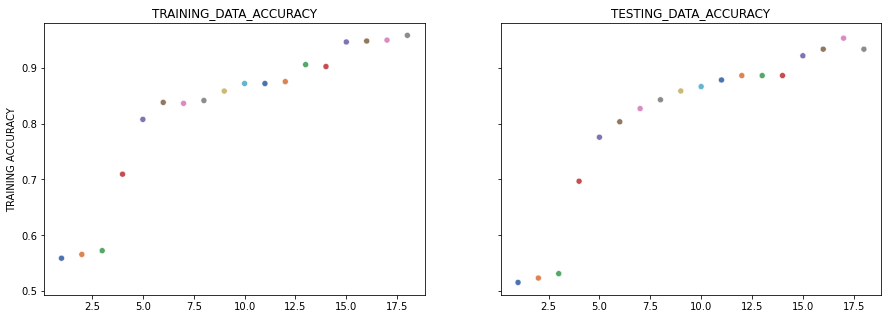

In [173]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharey=True)

sns.scatterplot(x=range(1,19),y=PCA_RESULTS['TRAINING ACCURACY'],hue = PCA_RESULTS['NO. OF PRINCIPAL COMPONENTS'], 
                ax=axes[0],palette="deep",legend=False)

sns.scatterplot(x=range(1,19),y=PCA_RESULTS['TESTING ACCURACY'],hue = PCA_RESULTS['NO. OF PRINCIPAL COMPONENTS'], 
                ax=axes[1],palette="deep",legend=False)

axes[0].set_title("TRAINING_DATA_ACCURACY")

axes[1].set_title("TESTING_DATA_ACCURACY")

plt.show()

In [116]:
PCA_TUNED = PCA(n_components=13)
PCA_X_TUNED = PCA_TUNED.fit_transform(X_STD)
PCA_TUNED_DF = pd.DataFrame(PCA_TUNED.components_,columns=list(X_STD))
COV_MX_TUNED = np.cov(X_STD.T)
EIGEN_VALUES_TUNED, EIGEN_VECTORS_TUNED = np.linalg.eig(COV_MX_TUNED)
PCA_OPT = np.array(EIGEN_VECTORS_FIN[0:13])   
X_STD_13D = np.dot(X_STD,PCA_OPT.T)   
PCA_DF_TUNED = pd.DataFrame(X_STD_13D)
X_TRAIN_13D, X_TEST_13D, Y_TRAIN_13D, Y_TEST_13D = train_test_split(PCA_DF_TUNED, Y, test_size = 0.3, random_state = 10)
SVM_MODEL = SVC(kernel='linear',C=1,gamma=.6)
SVM_MODEL.fit(X_TRAIN_13D, Y_TRAIN_13D)
PREDICTION = SVM_MODEL.predict(X_TEST_13D)
TRAIN_ACC = SVM_MODEL.score(X_TRAIN_13D,Y_TRAIN_13D)
TEST_ACC = SVM_MODEL.score(X_TEST_13D,Y_TEST_13D)
print('TRAINING DATA ACCURACY:',TRAIN_ACC)
print('TESTING DATA ACCURACY:',TEST_ACC)

TRAINING DATA ACCURACY: 0.9054054054054054
TESTING DATA ACCURACY: 0.8858267716535433


In [117]:
MODEL = SVC()

PARAMS_C = {'C': np.arange( 1, 100+1, 1 ).tolist(),
            'gamma': np.arange( 0.0, 10.0+0.0, 0.1 ).tolist(),
            'kernel': ['linear','rbf']}

RANDOM_SEARCH = RandomizedSearchCV(model, param_distributions=PARAMS_C, 
                                   n_iter=50, scoring='accuracy',n_jobs=-1,cv=5)

In [140]:
RANDOM_SEARCH.fit(X_TRAIN,Y_TRAIN)

RandomizedSearchCV(cv=5,
                   estimator=SVC(C=0.01, degree=2, gamma=0.1, kernel='poly'),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'C': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,
                                              12, 13, 14, 15, 16, 17, 18, 19,
                                              20, 21, 22, 23, 24, 25, 26, 27,
                                              28, 29, 30, ...],
                                        'gamma': [0.0, 0.1, 0.2,
                                                  0.30000000000000004, 0.4, 0.5,
                                                  0.6000000000000001,
                                                  0.7000000000000001, 0.8, 0.9,
                                                  1.0, 1.1, 1.2000000000000002,
                                                  1.3, 1.4000000000000001, 1.5,
                                                  1.6, 1.7000000000000002, 1.8,
                   

In [141]:
RANDOM_SEARCH.best_params_

{'kernel': 'rbf', 'gamma': 0.1, 'C': 17}

    * SINCE WE ARE USING RANDOMISED SEARCH CV FUNCTION TO FIND BEST HYPER PARAMETERS DO REMEMBER THAT:
        * EVERY TIME WE RUN THE ABOVE CODE, EXPECT TO GET A NEW BEST HYPER PARAMETERS AT EVERY INSTANCE
        * TO REDUCE THE COMPUTATION TIME AND OVER LOAD ON THE SYSTEM RESOURCES, I PREFERED TO USE THIS METHOD
          OVER GRID SEARCH SINCE GRID SEARCH IS TAKING TOO MUCH OF TIME TO RUN.

In [142]:
SVM_BEST = SVC(kernel= 'rbf', gamma= 0.1, C= 17)

BEST_RESULTS = pd.DataFrame()

SVM_BEST.fit(X_TRAIN, Y_TRAIN)
PREDICTION = SVM_BEST.predict(X_TEST)
TRAIN_ACC = SVM_BEST.score(X_TRAIN,Y_TRAIN)
TEST_ACC = SVM_BEST.score(X_TEST,Y_TEST)
BEST_RESULTS = BEST_RESULTS.append(pd.Series(['BEFORE PCA',TRAIN_ACC,TEST_ACC]),ignore_index=True)


SVM_BEST.fit(X_TRAIN_6D, Y_TRAIN_6D)
PREDICTION = SVM_BEST.predict(X_TEST_6D)
TRAIN_ACC = SVM_BEST.score(X_TRAIN_6D,Y_TRAIN_6D)
TEST_ACC = SVM_BEST.score(X_TEST_6D,Y_TEST_6D)
BEST_RESULTS = BEST_RESULTS.append(pd.Series(['AFTER PCA WITH 6 DIMENSIONS',TRAIN_ACC,TEST_ACC]),ignore_index=True)


SVM_BEST.fit(X_TRAIN_13D, Y_TRAIN_13D)
PREDICTION = SVM_BEST.predict(X_TEST_13D)
TRAIN_ACC = SVM_BEST.score(X_TRAIN_13D,Y_TRAIN_13D)
TEST_ACC = SVM_BEST.score(X_TEST_13D,Y_TEST_13D)
BEST_RESULTS = BEST_RESULTS.append(pd.Series(['AFTER PCA WITH 13 DIMENSIONS',TRAIN_ACC,TEST_ACC]),ignore_index=True)

BEST_RESULTS.columns = ['BEFORE/AFTER PCA','TRAINING ACCURACY','TESTING ACCURACY']

In [143]:
BEST_RESULTS

,BEFORE/AFTER PCA,TRAINING ACCURACY,TESTING ACCURACY
0,BEFORE PCA,1.000000,0.984252
1,AFTER PCA WITH 6 DIMENSIONS,0.935811,0.921260
2,AFTER PCA WITH 13 DIMENSIONS,0.996622,0.944882


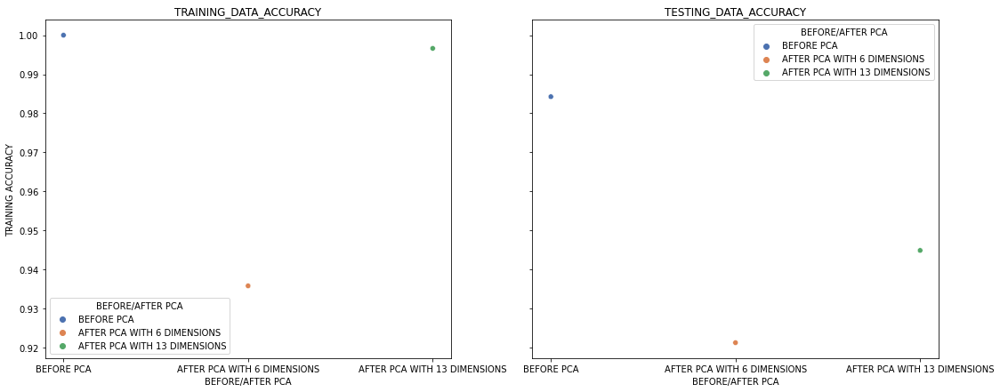

In [188]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7), sharey=True)

sns.scatterplot(x=BEST_RESULTS['BEFORE/AFTER PCA'],y=BEST_RESULTS['TRAINING ACCURACY'],hue = BEST_RESULTS['BEFORE/AFTER PCA'], 
                ax=axes[0],palette="deep")

sns.scatterplot(x=BEST_RESULTS['BEFORE/AFTER PCA'],y=BEST_RESULTS['TESTING ACCURACY'],hue = BEST_RESULTS['BEFORE/AFTER PCA'], 
                ax=axes[1],palette="deep")

axes[0].set_title("TRAINING_DATA_ACCURACY")

axes[1].set_title("TESTING_DATA_ACCURACY")

plt.show()

    * WE CAN EITHER USE GRID_SEARCHCV OR RANDOMISED_SEARCHCV FOR FINDING BEST HYPER PARAMETERS.
    * I USED RANDOMISED_SEARCHCV TO FIND BEST PARAMETERS TO REDUCE COMPUTATION TIME OVER USING GRID_SEARCHCV.
    * WE RE-TRAINED THE SVM MODEL WITH THE BEST HYPER PARAMETERS AND RESULTS WERE PUBLISHED.
    * FROM THE ABOVE OUTPUT WE CAN DEDUCT BELOW FINDINGS:
                        * MODEL PERFORMANCE BEFORE PCA WITH BEST PARAMETERS IS AT MAX 100%
                        * ON REDUCING DIMENSIONS TO 6, MODEL STILL PERFORMED GREAT AT 93.5% ACCURACY
                        * WE CAN SEE THAT AT 13 DIMENSIONS, MODEL TRAINING DATA ACCURACY IS ALMOST NEAR TO 100%
    * DO NOTE THAT FOR EVERY SET OF OUTPUT PARAMETERS FROM RANDOMISED SEARCH CV, WE GET VARIATION IN THE RESULTS

# B. Share best Parameters observed from above step.

In [144]:
print('BEST PARAMETERS FROM HYPER TUNING:\n',RANDOM_SEARCH.best_params_)

BEST PARAMETERS FROM HYPER TUNING:
 {'kernel': 'rbf', 'gamma': 0.1, 'C': 17}


    * WE USED RANDOMISED_SEARCHCV TO FIND THE BEST PARAMETERS WHICH ARE AS BELOW:
    
        KERNEL: RBF
        GAMMA: 0.1
            C: 17
            
        ALSO WE COULD SEE THAT ON REDUCING TO 6 DIMENSIONS WE ARE STILL GETTING GOOD MODEL PERFORMANCE
        
        ACCURACY IS REDUCED ON REDUCING THE DIMENSIONS BUT STILL WE ARE HAVING THE ACCURACY MORE THAN 90%

# C. Print Classification metrics for train data of above model and share relative improvement in performance in all the models along with insights.

In [198]:
SVM_BEST.fit(X_TRAIN, Y_TRAIN)
PREDICTION = SVM_BEST.predict(X_TEST)
print('CLASSIFICATION REPORT BEFORE APPLYING PCA DIMENSION REDUCTION\n')
print(classification_report(Y_TEST,PREDICTION),'\n')

SVM_BEST.fit(X_TRAIN_6D, Y_TRAIN_6D)
PREDICTION = SVM_BEST.predict(X_TEST_6D)
print('CLASSIFICATION REPORT AFTER APPLYING PCA DIMENSION REDUCTION TO 6 DIMENSIONS\n')
print(classification_report(Y_TEST_6D,PREDICTION),'\n')

SVM_BEST.fit(X_TRAIN_13D, Y_TRAIN_13D)
PREDICTION = SVM_BEST.predict(X_TEST_13D)
print('CLASSIFICATION REPORT AFTER APPLYING PCA DIMENSION REDUCTION TO 13 DIMENSIONS\n')
print(classification_report(Y_TEST_13D,PREDICTION),'\n')

CLASSIFICATION REPORT BEFORE APPLYING PCA DIMENSION REDUCTION

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        71
           1       0.97      1.00      0.98       125
           2       1.00      0.93      0.96        58

    accuracy                           0.98       254
   macro avg       0.99      0.98      0.98       254
weighted avg       0.98      0.98      0.98       254
 

CLASSIFICATION REPORT AFTER APPLYING PCA DIMENSION REDUCTION TO 6 DIMENSIONS

              precision    recall  f1-score   support

           0       0.96      0.94      0.95        71
           1       0.94      0.93      0.94       125
           2       0.84      0.88      0.86        58

    accuracy                           0.92       254
   macro avg       0.91      0.92      0.91       254
weighted avg       0.92      0.92      0.92       254
 

CLASSIFICATION REPORT AFTER APPLYING PCA DIMENSION REDUCTION TO 13 DIMENSIONS

              

    * LOOKING AT THE ABOVE SCORES, WE CAN SEE THAT MODEL IS HAVING MORE THAN 90% ACCURACY ON ALL 3 SCENARIOS.
    
    * ON RAW DATA, TRAINING ACCURACY IS HIGH AT 98%
    
    * WE HAVE REDUCED THE DIMENSIONS TO 6 AND 13 USING PCA.
    
    * AT 6 DIMENSIONS, ACCURACY IS STILL 92% SHOWING THE COMPONENTS ARE CORRELATED STRONGLY
    
    * AT 13 DIMENSIONS, TRAINING ACCURACY IS 94% WHICH SHOWS THE INCREASE IN HIGHLY CORRELATED COMPONENTS.
    
    * OVER ALL AFTER PCA DIMENSIONALITY REDUCTION, MODEL IS STILL PERFORMING VERY BEST.

# 5. Data Understanding & Cleaning:

# A. Explain pre-requisite/assumptions of PCA.

    WHAT IS PCA?
    ************

    * PCA IS A UN-SUPERVISED LEARNING TECHNIQUE THAT HELPS IN REDUCING THE DIMENSIONALITY IN THE INPUT DATA SET.
    
    * WHEN A DATA SET IS HAVING HIGHER DIMENSIONALITY, PCA TREATS EACH VARIABLE AS PRINCIPLE COMPONENT AND THEN
      PAIRS WITH OTHER VARIABLE BY IDENTIFYING THE RELATIONSHIP BETWEEN THEM.
      
    * BY THIS WE CAN SEE THAT THE FIRST PRINCIPLE COMPONENT WILL BE HAVING MORE VARIATION AND IT GETS DECREASED AS
      WE MOVE DOWN TO LAST PRINCIPLE COMPONENTS WHICH HAVE LEAST VARIATION.
      
    * AS WE REDUCE THE DIMENSIONS, WE COULD THE DECREASE IN ACCURACY OF THE MODEL.
    
    * THIS DIMENSIONALITY REDUCTION ALSO ALLOWS TO TRAVERSE THROUGH MINIMUM COLUMNS AND VISUALIZE THEM EASILY
    
    * THIS MAKES THE MACHINE LEARNING MODEL EASIER TO ANALYSE AND MAKES IT FASTER TO PROCESS.
      
    * INORDER TO ACHIEVE THIS WE NEED TO HAVE SOME ASSUMPTIONS ON THE DATA SET WHICH WILL BE DISCUSSED BELOW.

    PRE-REQUISITE / ASSUMPTIONS OF PCA:
    ***********************************

    THERE ARE SOME ASSUMPTIONS TO BE MADE THAT MAKES THE DIMENSIONALITY REDUCTION EASIER:

    1. DATA SET IS LINEAR: ALL THE VARIABLES IN THE DATASET ARE IN LINEAR MANNER AND CONTAINS RELATIONSHIPS AMONG
       THEM SELVES.
       
    2. INDEPENDENT VARIABLES IN THE DATA SET ARE HIGHLY CORRELATED TO EACH OTHER AND REDUCED FEATURE SET REPRESENTS
       THE ORIGINAL DATA SET IN EFFECTIVE MANNER.
       
    3. DATA SET CONTAINS VERY LESS NUMBER OF OUTLIERS WHICH DEVIATES FROM MOST OF THE DATA POINTS AND HAVING MORE
       OUTLIERS MEANS THAT ERRORS ARE MORE AND REDUCES MODEL OVERALL PERFORMANCE.
       
    4. ALL THE FEATURES ARE LOW DIMENSIONAL AND NUMERIC IN NATURE.
    
    5. PRINCIPLE COMPONENTS WITH HIGHER VARIANCE ARE GIVEN UTMOST IMPORTANCE WHERE AS PRINCIPLE COMPONENTS WITH 
       LOWER VARIANCE ARE TREATED AS NOISE.

# B. Explain advantages and limitations of PCA.

    ADVANTAGES OF PCA:
    ******************
    
    * DIMENSIONALITY REDUCTION HELPS IN VISUALIZING THE DATA SET EASIER DUE TO LESS FEATURES THAT MAKES IT EASIER
    
    * HELPS IN FINDING THE MOST IMPORTANT FEATURES OR VARIABLES THAT ARE NOT CO-RELATED
    
    * INCREASES THE SPEED OF MACHINE LEARNING ALGORITHM AS THERE ARE LESS FEATURES TO ANALYZE. IN AN OVERALL PCA
      INCREASES OVERALL ALGORITHM PERFORMANCE.
    
    * REDUCES THE OVER FITTING OF DATA. MORE VARIABLES CAUSES OVER FITTING OF DATA AND AS PCA REDUCES DIMENSIONALITY
      WE HAVE LESS FEATURES OR ONLY IMPORTANT FEATURES THAT REDUCES OVER FITTING OF THE DATA.
      
    * SIMPLIFY THE COMPLEX BUSINESS PROBLEMS AS IN PCA WE NEED TO TRAIN THE MODEL ONLY ON THE PRINCIPAL COMPONENTS 
      THAT REDUCES THE SIZE OF THE VARIABLES THAT NEEDS TO BE ANALYSED EARLIER.
      
    LIMITATIONS OF PCA:
    *******************
    
    * PCA RELIES ON GIVING PRIORITY TO VARIABLES THAT HAVE MORE VARIATION ON THE DATASET AND HENCE WE ARE 
      LOSING SOME FEATURES WHEN TRAINING THE MODEL USING PCA, THUS LEADING TO INFORMATION LOSS.
        
    * BEFORE APPLYING PCA, WE MUST STANDARDISE THE DATA SET, IF WE DO NOT STANDARDISE THE DATA, IT BECOMES DIFFICULT
      FOR PCA TO FIND OUT THE IMPORTANT FEATURES.
      
    * THE STANDARDISATION HAS TO BE DONE ON ALL THE FEATURES BEFORE APPLYING PCA BUT ON LATER STAGE WE TENDS TO
      USE ONLY COLUMNS THAT HAS HIGH VARIATION ON THE DATA.
      
    * SINCE WE ARE STANDARSING THE DATA AND USING THE PRINCIPLE COMPONENTS, WE CANNOT INTERPRET THE ORIGINAL 
          VARIABLES IN THE DATA SET. ALSO NOTE THAT THESE PRINCIPAL COMPONENTS ARE NOT AS READABLE AS ORIGINAL DATA
          
    * WE ARE ASSUMING THE DATA SET TO BE LINEAR AND HENCE IT IS NOT SUITABLE TO CAPTURE THE NON-LINEAR DATA SET.
    
    * HAVING MORE OUTLIERS IN THE DATA CAN MAKE THE PCA TO IDENTIFY THE PRINCIPAL COMPONENTS DIFFICULT.

                       ********** END OF UNSUPERVISED LEARNING ASSESMENT **********